Here we are going to use traditional time series methods like ARIMA, SARIMA and machine learning approaches like DecisionTreeRegressor  from scikit-learn and Xgboost ensemble methods

# TIME SERIES MODELLING
Time series modeling involves predicting future values based on historical data. We'll explore three popular models: ARIMA for capturing linear patterns, Prophet designed for seasonality and holidays, and XGBoost, a versatile ensemble method, suitable for capturing complex non-linear relationships in time series data. Each model brings unique strengths to forecasting tasks.
#### Importing modules needed

In [1]:
#importing modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings(action='ignore') 
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from math import sqrt
from datetime import datetime

#### Reading the modelling data
Here we are reading data from a csv file

In [2]:
#reading the data
data = pd.read_csv("modelling_data.csv")
data.head()

,facility_name,ParkID,zone_id,total_parking_spots,occupancy_total,day_of_week,date,time,parking_availability,time_category,z_score
0,Edmondson Park South Car Park,1,1,1429,28,Friday,2023-12-01,00:09:20,1401,Night,2.535373
1,Edmondson Park South Car Park,1,1,1429,27,Friday,2023-12-01,00:12:57,1402,Night,2.537913
2,Edmondson Park South Car Park,1,1,1429,26,Friday,2023-12-01,00:13:45,1403,Night,2.540453
3,Edmondson Park South Car Park,1,1,1429,25,Friday,2023-12-01,00:17:43,1404,Night,2.542992
4,Edmondson Park South Car Park,1,1,1429,25,Friday,2023-12-01,00:27:43,1404,Night,2.542992


In [3]:
dddata= data.copy()

Joining date and time together to create a timestamp

In [4]:
#function to convert date and time into datetime
def g(df):
    df["time"] = df["time"].astype("str")
    df["timestamp"] = pd.to_datetime(df['date'] + ' ' + df['time'], format='%Y-%m-%d %H:%M:%S')
    return df

modelling_data = g(data)
#setting timestamp as the index
modelling_data.set_index("timestamp",  inplace=True)

In [5]:
#dropping columns we dont need
modelling_data.drop(["ParkID", "zone_id", "date", "time"], axis= 1,inplace= True)
modelling_data

,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
timestamp,,,,,,,
2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
...,...,...,...,...,...,...,...
2023-12-31 23:21:38,Campbelltown Hurley Street South Car Park,118,62,Sunday,56,Night,-0.880331
2023-12-31 23:31:38,Campbelltown Hurley Street South Car Park,118,62,Sunday,56,Night,-0.880331
2023-12-31 23:39:15,Campbelltown Hurley Street South Car Park,118,61,Sunday,57,Night,-0.877792


1. ARIMA model analysis
#
Doing analysis of trends using rolling means of different sizes, for instance daily,weekly and monthly. We are going to analyze our target variable only to understand its behavior

In [6]:
plotting_data = modelling_data.copy()
plotting_data.drop(columns=['facility_name', 'total_parking_spots', 'occupancy_total',
    'day_of_week', 'time_category', 'z_score'], inplace=True, axis=1)


In [7]:
#inspecting df
plotting_data

,parking_availability
timestamp,
2023-12-01 00:09:20,1401
2023-12-01 00:12:57,1402
2023-12-01 00:13:45,1403
2023-12-01 00:17:43,1404
2023-12-01 00:27:43,1404
...,...
2023-12-31 23:21:38,56
2023-12-31 23:31:38,56
2023-12-31 23:39:15,57


Plotting the total `parking availability` for time and day of the week

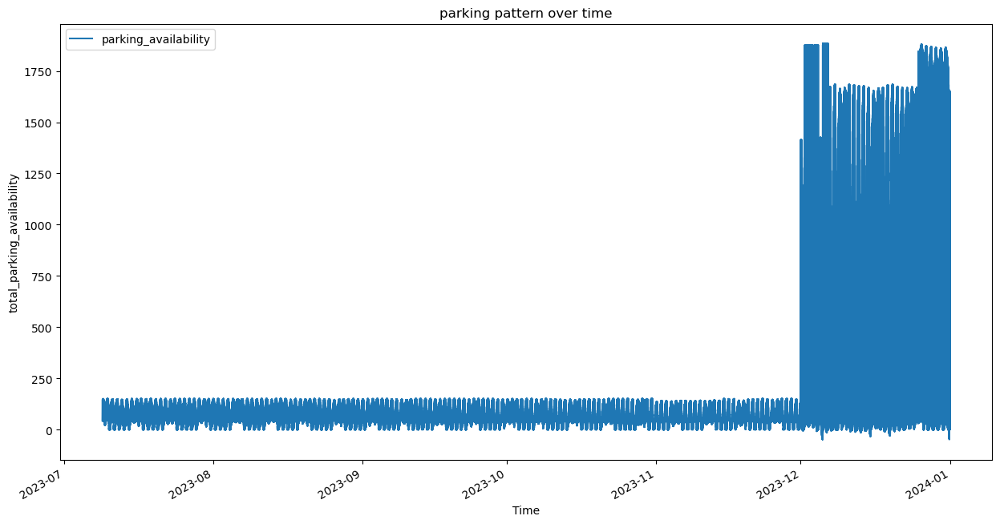

In [8]:
#plotting the parking availability trend
plotting_data.plot(figsize = (15, 8))
plt.title("parking pattern over time")
plt.xlabel('Time')
plt.ylabel("total_parking_availability")
plt.show()

Our time series data has high frequency or irregular time intervals, we considered resampling to a lower frequency to obtain a more meaningful plot. Resampling allows you to aggregate data over specified time intervals, in our case we shall resample the data down to day, week and month
#
We wrote a function to help us plot the patterns

In [9]:
#helper function for plotting patterns
def parking_pattern(data, size):
    data.plot(figsize = (15, 8))
    plt.title(f"parking pattern on a {size} basis")
    plt.xlabel('Time')
    plt.ylabel("total_parking_availability")
    plt.show()

1. Daily pattern of parking availability

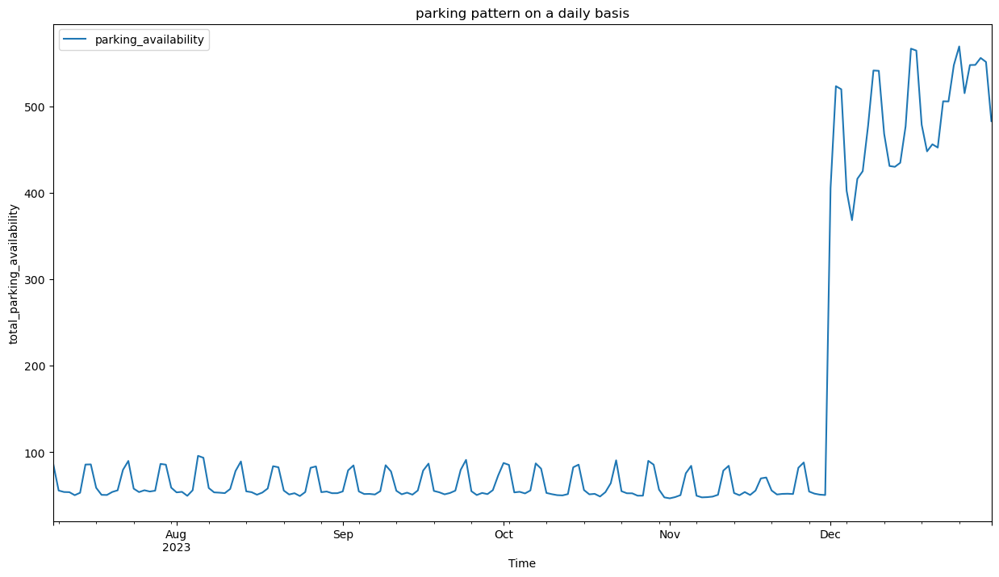

In [10]:
daily_pattern = plotting_data.resample("D").mean()
parking_pattern(daily_pattern, "daily")

There is a trend on the daily pattern of parking  spaces in cities. The number of available parking spots remains at a 100 for almost 5 months and shoots up almost to 600 during december.

2. Weekly pattern

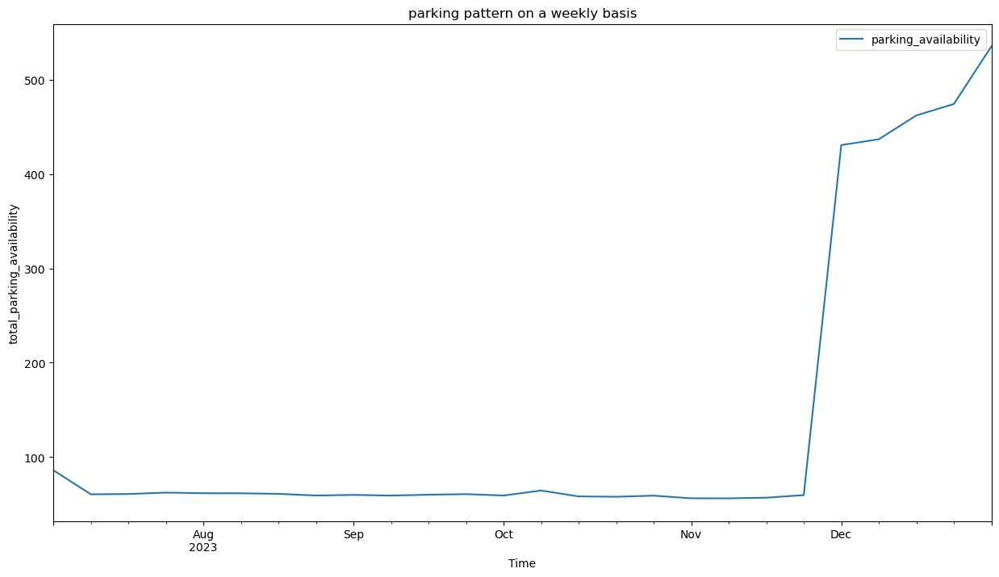

In [11]:
weekly_pattern = plotting_data.resample("W").mean()
parking_pattern(weekly_pattern, "weekly")

The weekly pattern is almost straight except for the last month when it rises

3. Monthly parking pattern

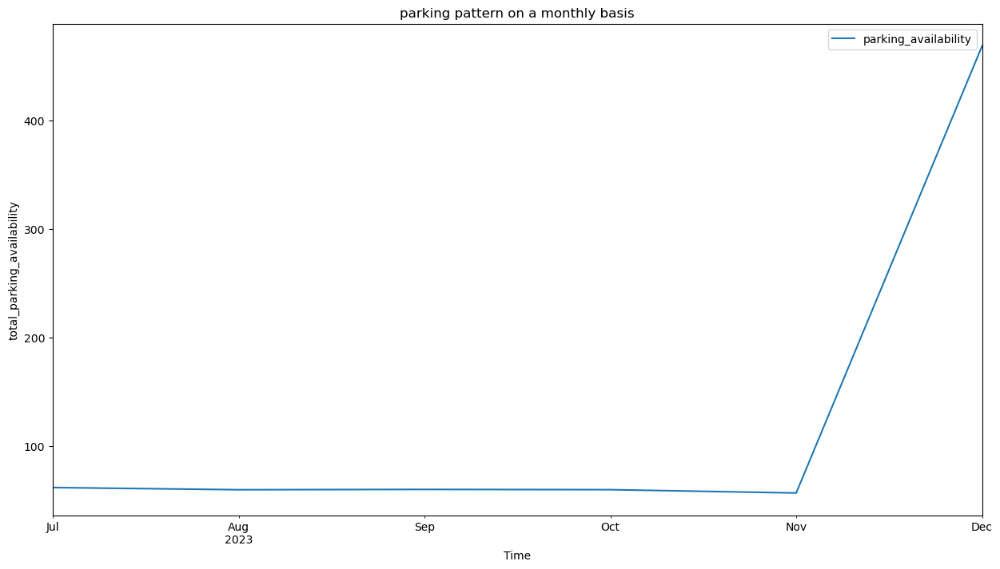

In [12]:
monthly_pattern = plotting_data.resample("M").mean()
parking_pattern(monthly_pattern, "monthly")

From the plot, parkin availability remains low over the months and increases in the final month. This is evident in all plots and can indicate that in the month of december people stay away from towns for the holidays and some visit upcountry to visit their friends or family
#### Stationarity
Checking for stationarity. A time series is considered stationary if its statistical properties, such as mean, variance, and autocorrelation, do not change over time. In simple words, the time series data shows consistent behavior and does not exhibit trends or seasonality.

In [13]:
#importing adfuller test from statsmodels
from statsmodels.tsa.stattools import adfuller
def stationarity_test(dataset):
    ad_test = adfuller(dataset, autolag = "AIC")
    print("1. ADF: ",ad_test[0])
    print("2. p-value: ",ad_test[1])
    print("3. Number of lags: ", ad_test[2])
    print("4. Number of obeservations used for ADF regression and critical values calculation: ", ad_test[3])
    print("5. Critical values: ")
    

In [14]:
#checking for stationarity
# stationarity_test(plotting_data["parking_availability"])

instantiating the `autoarima model` for our time series problem

In [15]:
# from pmdarima import auto_arima
# from sklearn.metrics import mean_squared_error, mean_absolute_error
# #fitting the model
# auto_arima_model = auto_arima(plotting_data["parking_availability"], trace= True, suppress_warnings= True)

Now that we already know the behavior of our data, the model to use and and the order to specify we will go ahead and train a model and make some few predictions. We are also going to split our data into train, test and validation

In [16]:
#importing arima model
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
#splitting data
train_data, test_data = train_test_split(daily_pattern, test_size= 0.3, random_state= 42)

In [17]:
#instantiating ARIMA model
arima_model = ARIMA(train_data, order = (2, 1, 2))
arima_model = arima_model.fit()
arima_model.summary()

e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\e

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:     parking_availability   No. Observations:                  123
Model:                   ARIMA(2, 1, 2)   Log Likelihood                -799.475
Date:                  Fri, 16 Feb 2024   AIC                           1608.950
Time:                          19:13:38   BIC                           1622.970
Sample:                               0   HQIC                          1614.644
                                  - 123                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5834      0.808     -0.722      0.470      -2.167       1.001
ar.L2         -0.1243      0.109     -1.145      0.252      -0.337       0.089
ma.L1         -0.4754      2.494     -0.191      0.849      -5.364       4.413
ma.L2         -0.5243      1.734     -0.302      0.762      -3.922       2.874
sigma2      2.769e+04   6.96e+04      0.398      0.691   -1.09e+05    1.64e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                56.43
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               1.99   Skew:                             1.59
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

We will also do a prediction to see how well our model has learnt. For the predict method, you need to pass in the start and end parameters for the period you want to predict

In [18]:
#specifying start and end
start = len(train_data)
end = len(train_data) + len(test_data)-1
predictions = arima_model.predict(start = start, end= end, type = "level")
predictions.index = plotting_data.index[start:end+1]
print(round(predictions, 2))


timestamp
2023-12-01 06:20:02    154.40
2023-12-01 06:21:02    143.76
2023-12-01 06:21:42    136.82
2023-12-01 06:24:01    142.19
2023-12-01 06:24:06    139.92
2023-12-01 06:24:13    140.58
2023-12-01 06:24:19    140.48
2023-12-01 06:25:38    140.45
2023-12-01 06:25:43    140.48
2023-12-01 06:28:24    140.47
2023-12-01 06:28:30    140.47
2023-12-01 06:29:01    140.47
2023-12-01 06:29:20    140.47
2023-12-01 06:31:51    140.47
2023-12-01 06:33:01    140.47
2023-12-01 06:33:46    140.47
2023-12-01 06:33:55    140.47
2023-12-01 06:34:03    140.47
2023-12-01 06:34:27    140.47
2023-12-01 06:34:55    140.47
2023-12-01 06:35:13    140.47
2023-12-01 06:35:56    140.47
2023-12-01 06:36:12    140.47
2023-12-01 06:37:26    140.47
2023-12-01 06:37:47    140.47
2023-12-01 06:38:00    140.47
2023-12-01 06:38:06    140.47
2023-12-01 06:38:12    140.47
2023-12-01 06:38:56    140.47
2023-12-01 06:39:04    140.47
2023-12-01 06:39:21    140.47
2023-12-01 06:39:27    140.47
2023-12-01 06:39:59    140.47


e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


Plotting prediction against  actual for a given time series to see how the model behaves visually

<Axes: xlabel='timestamp'>

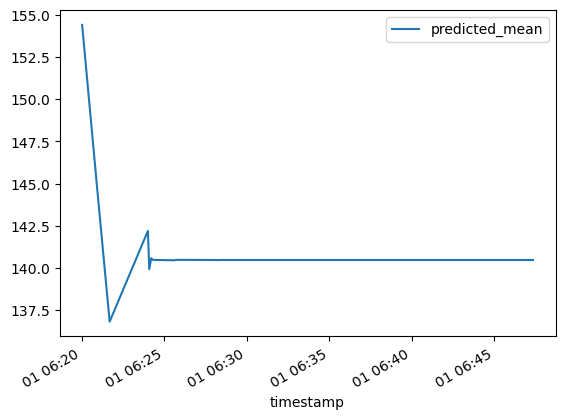

In [19]:
predictions.plot(legend =True)
# daily_pattern["parking_availability"].plot(legend= True)


If you want to see exactly how good or bad it is we can check the `mae`, `rmse` and the `rmse` of our train and test data then compare it to the mean of our dataset

In [20]:
print(daily_pattern.mean())

parking_availability    136.861683
dtype: float64


In [21]:
#getting the mse and rmse
pred_mse = (mean_squared_error(predictions, test_data))
pred_rmse = sqrt(mean_squared_error(predictions, test_data))
pred_mae = (mean_absolute_error(predictions, test_data))

print(f"The MSE score is {pred_mse}")
print(f"The RMSE score is {pred_rmse}")
print(f"The MAE score is: {pred_mae}")

The MSE score is 25663.695398437354
The RMSE score is 160.1989244609256
The MAE score is: 121.49136148720476


The rmse range is greater than the mean of the data, meaning that for every prediction we make we are  getting a value 160.2 further away from the actual result. This means that our model is not performing well and needs improvement
#
#### Making future predictions
For this to take place effectively we will train the model on the whole dataset

In [22]:
arima_model2 = ARIMA(plotting_data, order= (2,1,2))
arima_model2 = arima_model2.fit()

e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
e:\anaconda3\e

In [23]:
#setting up future dates 
future_dates = pd.date_range(start= "2024-01-01", end = "2024-01-31")
#making prediction
future_preds = arima_model2.predict(start = len(plotting_data), end = len(plotting_data)+ 30, type = "levels")
future_preds.index = future_dates
print(future_preds)

2024-01-01    57.042083
2024-01-02    57.008904
2024-01-03    57.018574
2024-01-04    57.024775
2024-01-05    57.015406
2024-01-06    57.020587
2024-01-07    57.020283
2024-01-08    57.018303
2024-01-09    57.020094
2024-01-10    57.019447
2024-01-11    57.019217
2024-01-12    57.019689
2024-01-13    57.019392
2024-01-14    57.019438
2024-01-15    57.019528
2024-01-16    57.019433
2024-01-17    57.019473
2024-01-18    57.019480
2024-01-19    57.019457
2024-01-20    57.019474
2024-01-21    57.019470
2024-01-22    57.019466
2024-01-23    57.019471
2024-01-24    57.019468
2024-01-25    57.019468
2024-01-26    57.019469
2024-01-27    57.019468
2024-01-28    57.019469
2024-01-29    57.019469
2024-01-30    57.019469
2024-01-31    57.019469
Freq: D, Name: predicted_mean, dtype: float64


e:\anaconda3\envs\mwiti-clone\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


Viewing the predictions from the `ARIMA` model, we can see there is similarity in the values except for the decimal values. This indicates our model  has not captured most of the seasonality and trend component.Our model maybe also overfitting  to the training data or it may be that the series does not have a strong enough seasonal component.

Having also many facilities makes it hard to interpret the prediction for each facility. To overcome this problem, we are going to group our data using facility name and then model time series for each facility in our dataset. This will ease prediction of a parking availability for a given facility, date and time

In [24]:
grouped_data = dddata.copy()
grouped_data.drop(columns=["ParkID", "zone_id"], axis= 1,inplace= True)

In [25]:
#inspecting df
grouped_data

,facility_name,total_parking_spots,occupancy_total,day_of_week,date,time,parking_availability,time_category,z_score
0,Edmondson Park South Car Park,1429,28,Friday,2023-12-01,00:09:20,1401,Night,2.535373
1,Edmondson Park South Car Park,1429,27,Friday,2023-12-01,00:12:57,1402,Night,2.537913
2,Edmondson Park South Car Park,1429,26,Friday,2023-12-01,00:13:45,1403,Night,2.540453
3,Edmondson Park South Car Park,1429,25,Friday,2023-12-01,00:17:43,1404,Night,2.542992
4,Edmondson Park South Car Park,1429,25,Friday,2023-12-01,00:27:43,1404,Night,2.542992
...,...,...,...,...,...,...,...,...,...
599280,Campbelltown Hurley Street South Car Park,118,62,Sunday,2023-12-31,23:21:38,56,Night,-0.880331
599281,Campbelltown Hurley Street South Car Park,118,62,Sunday,2023-12-31,23:31:38,56,Night,-0.880331
599282,Campbelltown Hurley Street South Car Park,118,61,Sunday,2023-12-31,23:39:15,57,Night,-0.877792
599283,Campbelltown Hurley Street South Car Park,118,61,Sunday,2023-12-31,23:49:15,57,Night,-0.877792


### 2. PROPHET
After grouping our data, we are going to an advanced machine learning algorithm called `Prophet`. Prophet is an open-source forecasting tool developed by Facebook for time series analysis. It is designed to handle daily observations that display patterns such as seasonality and holidays. Prophet simplifies the forecasting process and provides intuitive methods for producing accurate predictions with customizable components.

We will create a class for the `Prophet` that iterates over grouped data does time series using given columns and allows us to make predictions  on future data. 


In [26]:
#function to convert to datetime
def to_datetime(x):
    return datetime.strptime(x,  "%Y-%m-%d %H:%M:%S")

pprophet_data = pd.read_csv("modelling_data.csv", parse_dates= [["date", "time"]], date_parser= to_datetime)

Using few data variables to kick-start our prophet model

In [27]:
#setting datetime as index
prophet_data = pprophet_data.drop(["day_of_week", "time_category", "ParkID", "zone_id", "z_score"], axis= 1)
prophet_data = prophet_data.set_index("date_time").groupby("facility_name").resample("D").mean()
#inspecting our data
prophet_data.head()

total_parking_spots  occupancy_total  \
facility_name        date_time                                          
Bella Vista Car Park 2023-12-01                777.0       332.854559   
                     2023-12-02                777.0       197.873521   
                     2023-12-03                777.0       137.133550   
                     2023-12-04                777.0       346.532401   
                     2023-12-05                777.0       409.501304   

                                 parking_availability  
facility_name        date_time                         
Bella Vista Car Park 2023-12-01            444.145441  
                     2023-12-02            579.126479  
                     2023-12-03            639.866450  
                     2023-12-04            430.467599  
                     2023-12-05            367.498696

We have two index columns in our grouped dataframe, we will reset the index, return `date_time` as the index and plot  and do some visualizations on our facilities

In [28]:
#resetting index
prophet_data = prophet_data.reset_index()


Plotting all trends in one plot for each individual time series for each car park. This helps us understand the behavior of each car park facility

In [29]:
import matplotlib.pyplot as plt

def plot_facilities(data, facilities, columns=["total_parking_spots", "occupancy_total", "parking_availability"], figsize=(15, 5)):
    # Set the 'date_time' column as the index
    data = data.set_index("date_time")

    # Filter data for the specified facilities
    filtered_data = data[data['facility_name'].isin(facilities)]

    for facility in facilities:
        facility_data = filtered_data.query(f"facility_name == '{facility}'")

        # Create a new figure for each facility
        fig, ax = plt.subplots(figsize=figsize)
        
        # Plot the data for the current facility
        facility_data[columns].plot(ax=ax, label=facility)

        # Set title, labels, and legend
        ax.set_title(f"Time Series Data for {facility}")
        ax.set_xlabel("Date and Time")
        ax.set_ylabel("Values")
        ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

        plt.show()

# Example usage
facilities_to_plot = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park", "Campbelltown Farrow Rd North Car Park " ,
                    "Warwick Farm Car Park", "Warriewood Car Park", "Tallawong P3 Car Park ", "Tallawong P3 Car Park", "Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Schofields Car Park ", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park", "Kiama Car Park ",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park", "Gosford Car Park ",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park", "Campbelltown Hurley Street South Car Park "]





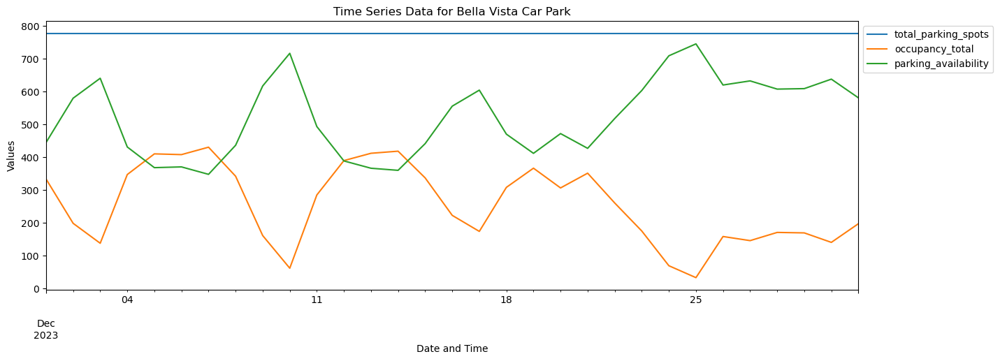

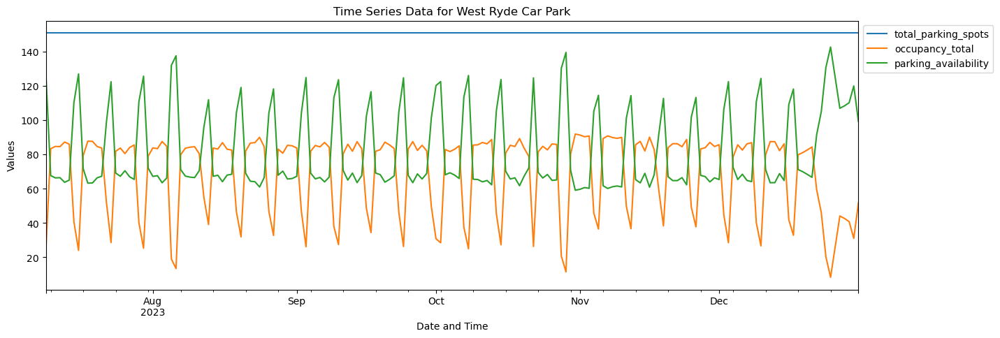

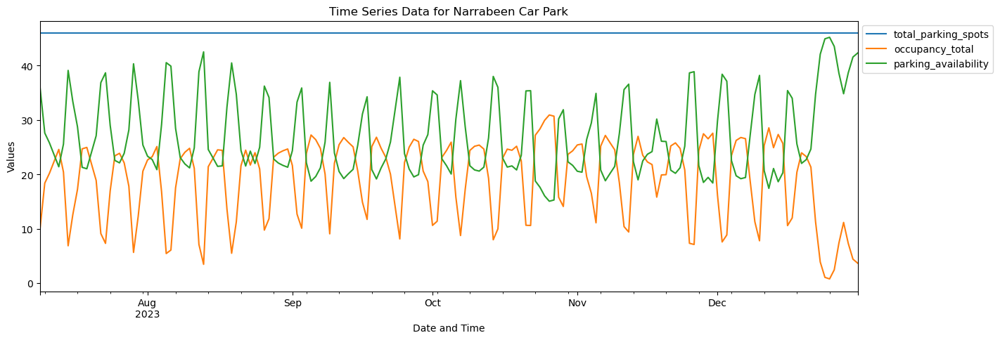

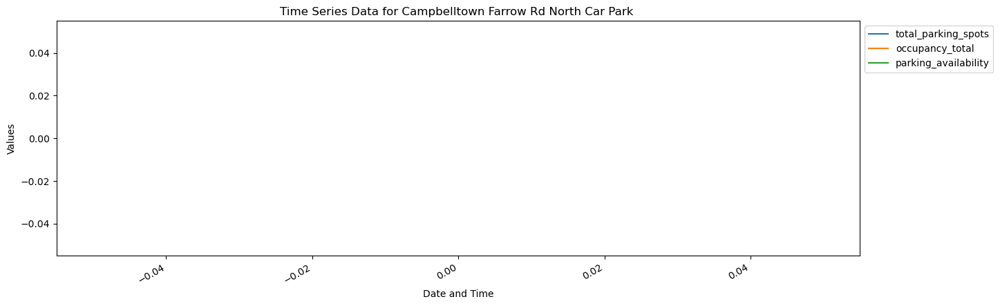

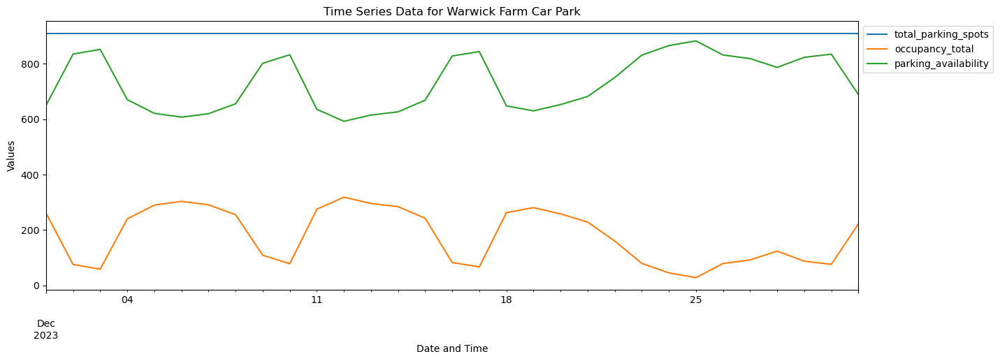

...

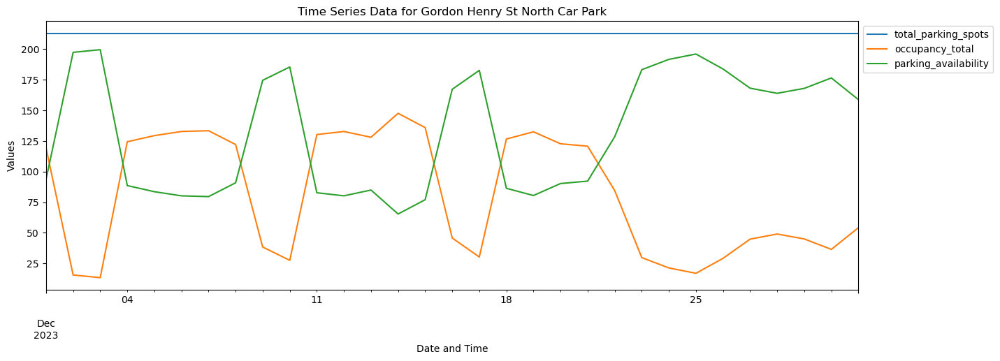

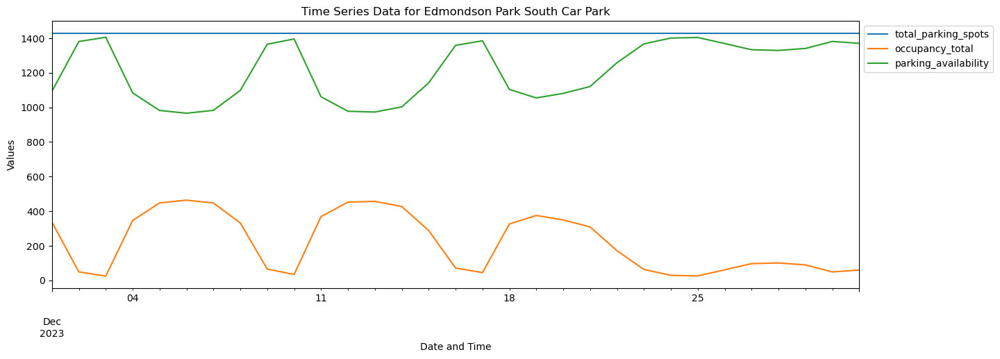

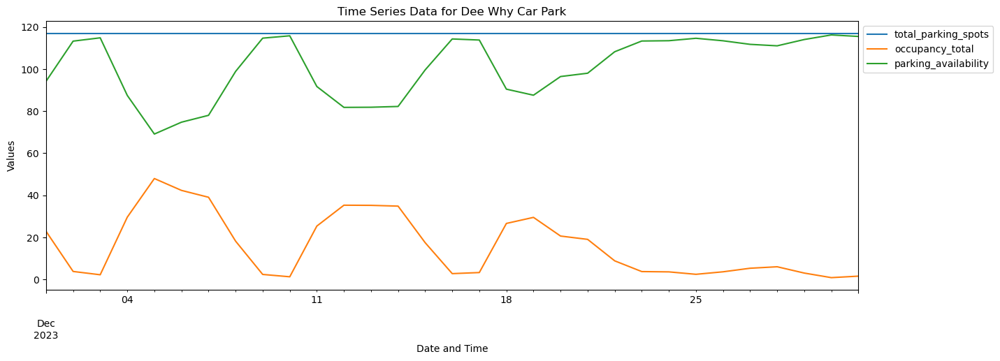

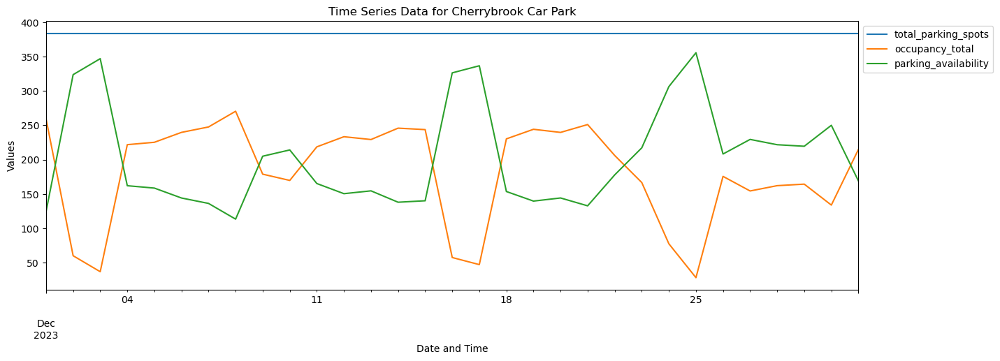

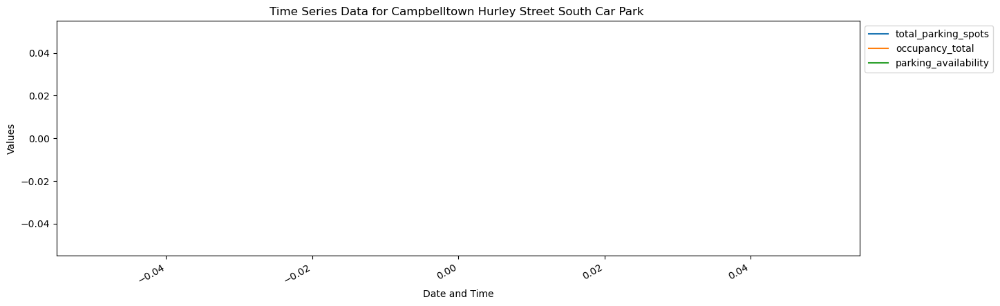

In [30]:
#calling the plot function
plot_facilities(prophet_data, facilities_to_plot, figsize=(15, 5))

Voila! We can see our parking facilities have different seasonalities and trends. We can not generalize this and build one time series model. What we will do is to create separate models for each of the facility, which will allow us to make accurate predictions and forecasting.

In [31]:
prophet_data

,facility_name,date_time,total_parking_spots,occupancy_total,parking_availability
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696
...,...,...,...,...,...
1153,West Ryde Car Park,2023-12-27,151.0,44.062500,106.937500
1154,West Ryde Car Park,2023-12-28,151.0,42.627692,108.372308
1155,West Ryde Car Park,2023-12-29,151.0,40.794304,110.205696
1156,West Ryde Car Park,2023-12-30,151.0,31.003378,119.996622


#### 1. Prophet model
Prophet is a time series forecasting tool developed by Facebook that utilizes an additive model to capture seasonality, trends, and holidays, providing a user-friendly approach for accurate and efficient predictions.
#
We will create a final dataframe that has the date_time column and the columns we will need for our analysis. Prophet model expects data in a particular format; it expects the name of date column to be "ds" and the target variable as y
#
Before everything we will create a prophet pipeline

In [32]:
#importin
from sklearn.pipeline import Pipeline
import prophet
#creating a pipeline
prophet_pipeline = Pipeline(steps=[
    ("prophet", prophet.Prophet(interval_width = 0.95))
])

In [33]:
final_prophet_data = prophet_data[["facility_name", "date_time",
                    "occupancy_total", "parking_availability"]].rename({"date_time": "ds", "parking_availability": "y"}, axis = "columns")
final_prophet_data

,facility_name,ds,occupancy_total,y
0,Bella Vista Car Park,2023-12-01,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,409.501304,367.498696
...,...,...,...,...
1153,West Ryde Car Park,2023-12-27,44.062500,106.937500
1154,West Ryde Car Park,2023-12-28,42.627692,108.372308
1155,West Ryde Car Park,2023-12-29,40.794304,110.205696
1156,West Ryde Car Park,2023-12-30,31.003378,119.996622


Grouping by facility names to allow us to know all the stations and model different time series

In [34]:
facility_names = final_prophet_data.groupby("facility_name")
facility_names.head()

,facility_name,ds,occupancy_total,y
0,Bella Vista Car Park,2023-12-01,332.854559,444.145441
1,Bella Vista Car Park,2023-12-02,197.873521,579.126479
2,Bella Vista Car Park,2023-12-03,137.133550,639.866450
3,Bella Vista Car Park,2023-12-04,346.532401,430.467599
4,Bella Vista Car Park,2023-12-05,409.501304,367.498696
...,...,...,...,...
982,West Ryde Car Park,2023-07-09,26.096154,124.903846
983,West Ryde Car Park,2023-07-10,83.332623,67.667377
984,West Ryde Car Park,2023-07-11,84.679089,66.320911
985,West Ryde Car Park,2023-07-12,84.564356,66.435644


Creating an empty dataframe so we can build a forecast for the whole 28 facilities

19:15:15 - cmdstanpy - INFO - Chain [1] start processing


19:15:15 - cmdstanpy - INFO - Chain [1] done processing


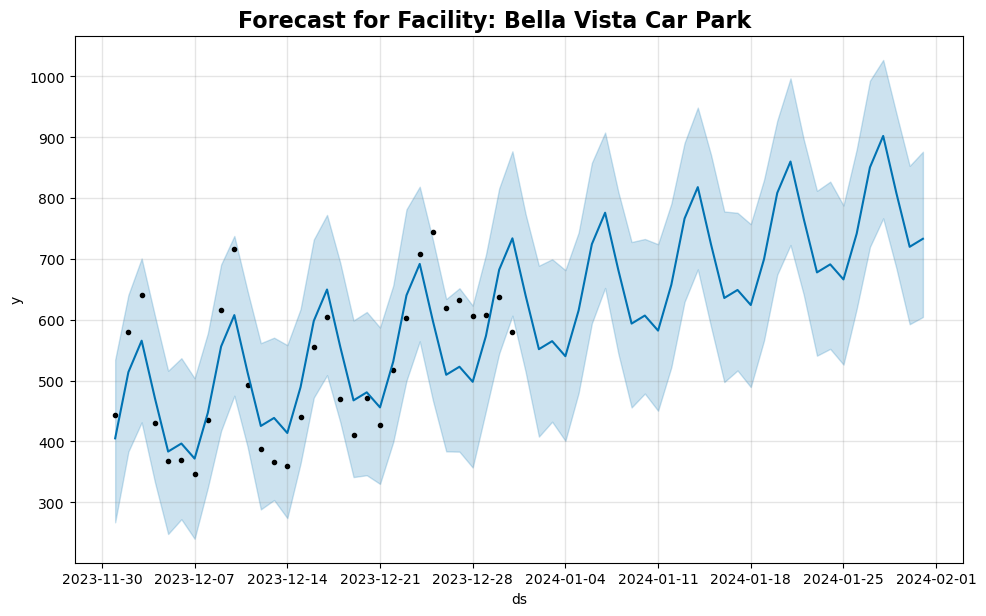

19:15:15 - cmdstanpy - INFO - Chain [1] start processing
19:15:15 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Bella Vista Car Park
MSE: 3262.8558978112746
RMSE: 57.121413653824035
MAE: 47.467680138180576




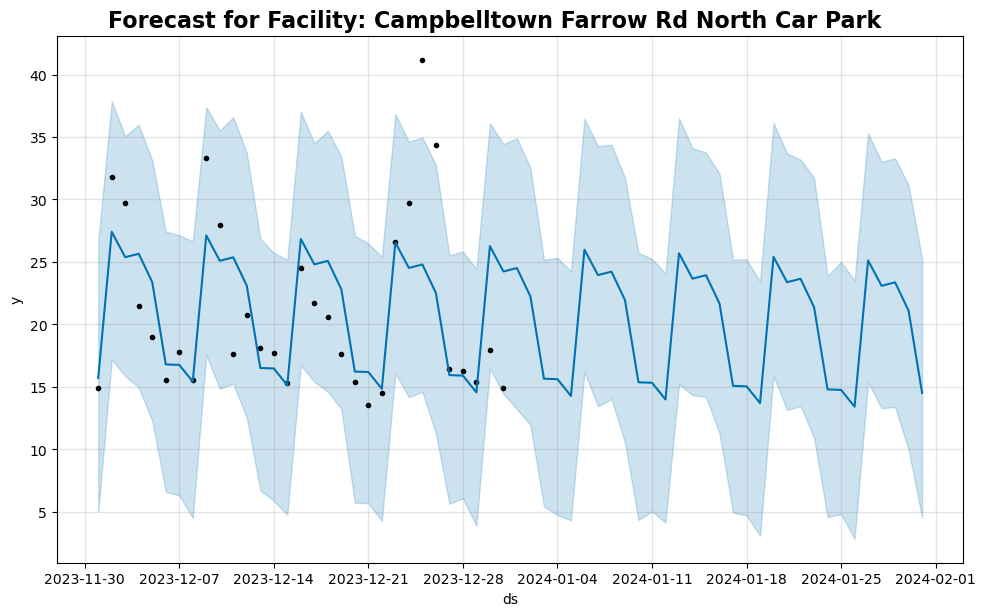

19:15:16 - cmdstanpy - INFO - Chain [1] start processing
19:15:16 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Campbelltown Farrow Rd North Car Park
MSE: 22.328680248864476
RMSE: 4.725323295697817
MAE: 3.323779578005449




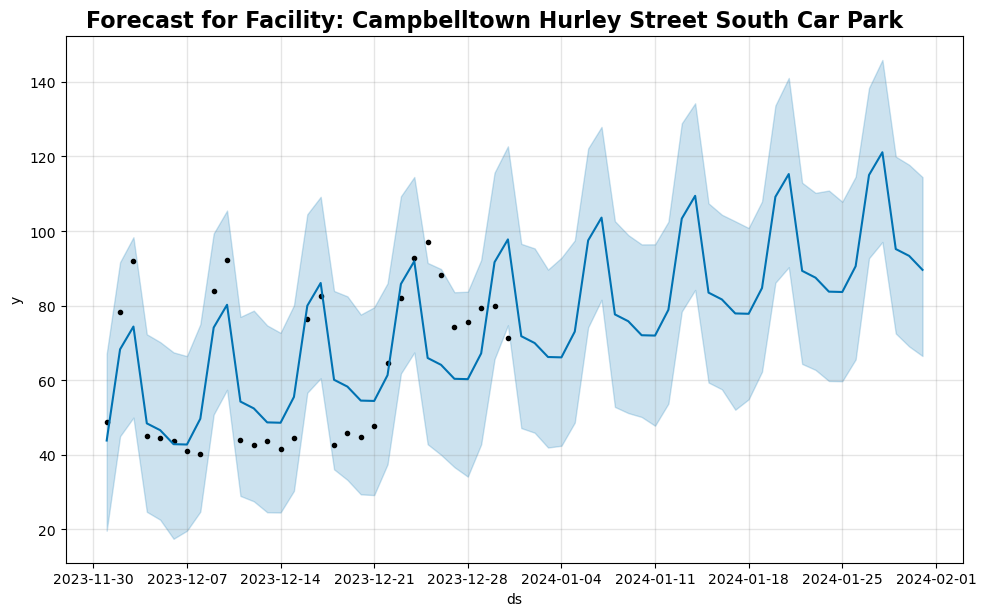

19:15:16 - cmdstanpy - INFO - Chain [1] start processing
19:15:16 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Campbelltown Hurley Street South Car Park
MSE: 112.03012406241064
RMSE: 10.584428376743386
MAE: 8.303877264467838




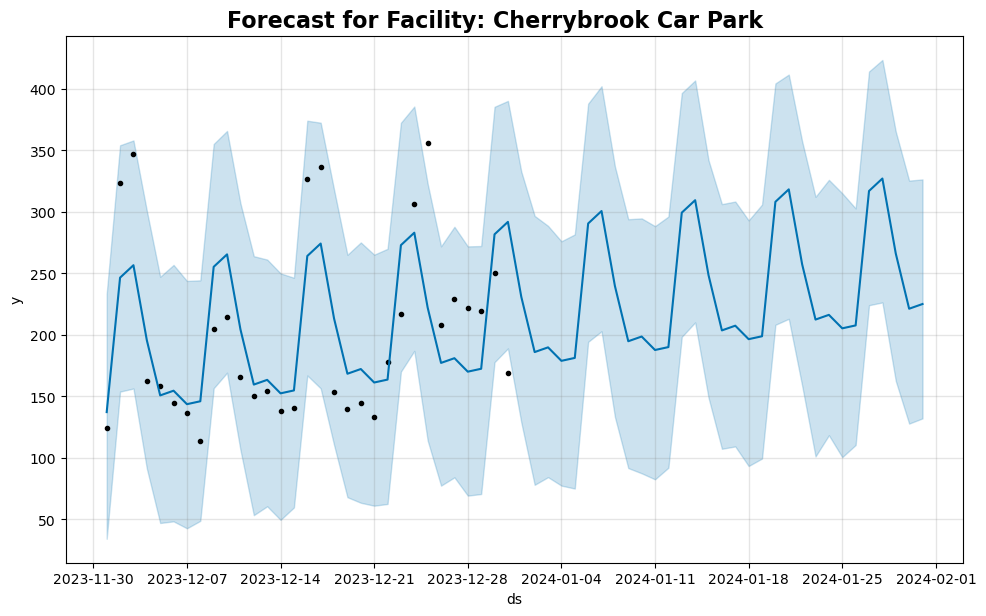

19:15:16 - cmdstanpy - INFO - Chain [1] start processing
19:15:17 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Cherrybrook Car Park
MSE: 2374.3905274821063
RMSE: 48.727718266733014
MAE: 38.18347655410203




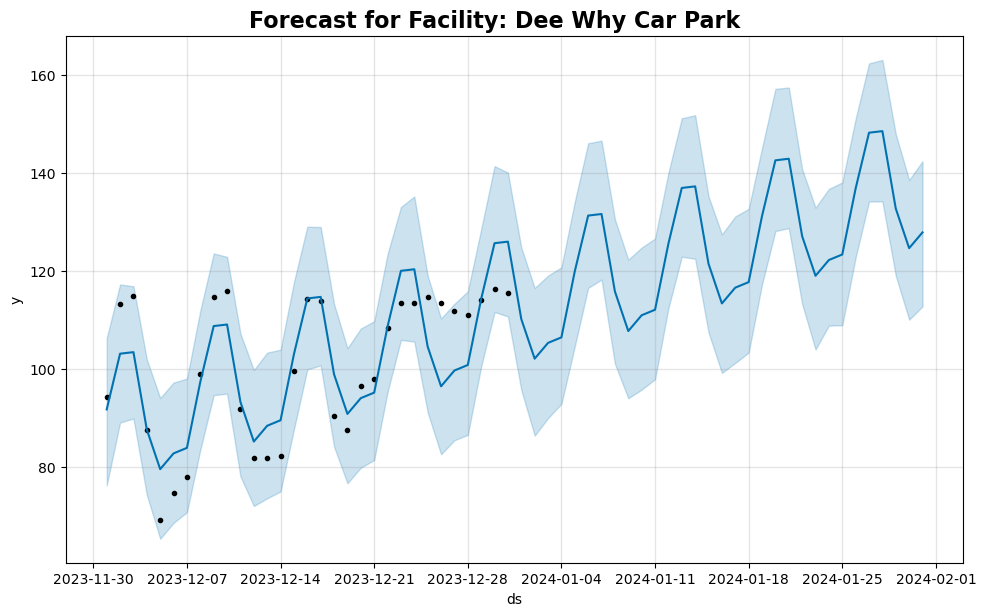

19:15:17 - cmdstanpy - INFO - Chain [1] start processing
19:15:17 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Dee Why Car Park
MSE: 37.71851309174764
RMSE: 6.141539960933873
MAE: 5.0743748336401415




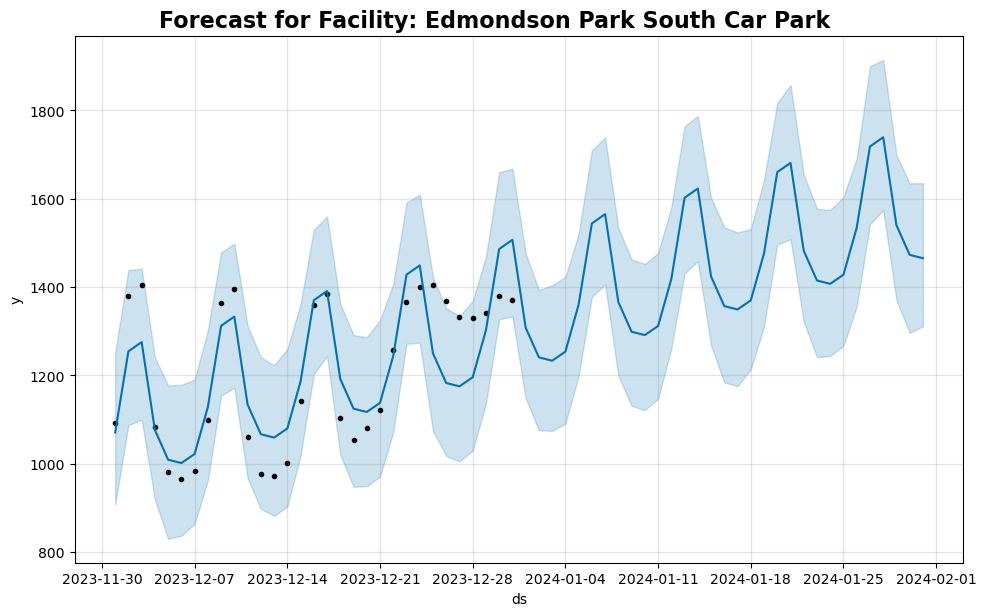

19:15:17 - cmdstanpy - INFO - Chain [1] start processing
19:15:17 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Edmondson Park South Car Park
MSE: 4696.941467402819
RMSE: 68.53423573224421
MAE: 56.37832670324041




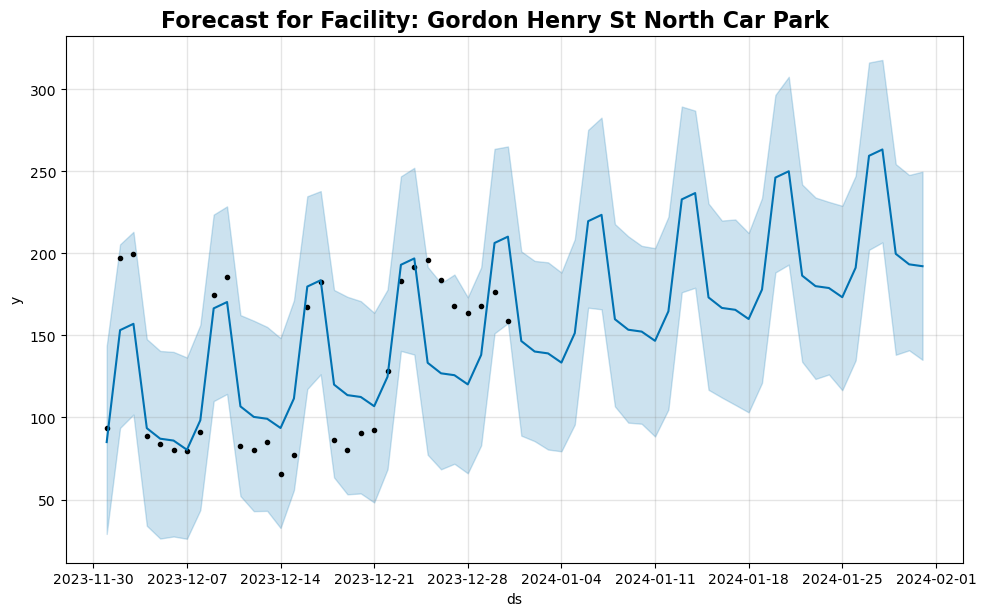

19:15:18 - cmdstanpy - INFO - Chain [1] start processing
19:15:18 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Gordon Henry St North Car Park
MSE: 583.7976980857549
RMSE: 24.16190592825315
MAE: 18.42075014094938




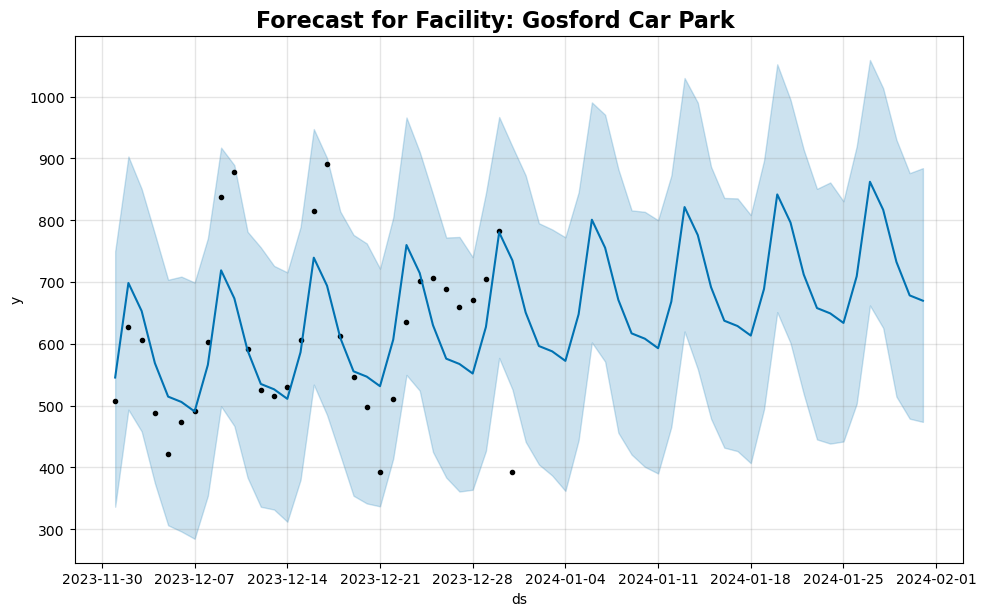

19:15:18 - cmdstanpy - INFO - Chain [1] start processing
19:15:18 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Gosford Car Park
MSE: 7186.184100748968
RMSE: 84.77136368343362
MAE: 62.58099808769504




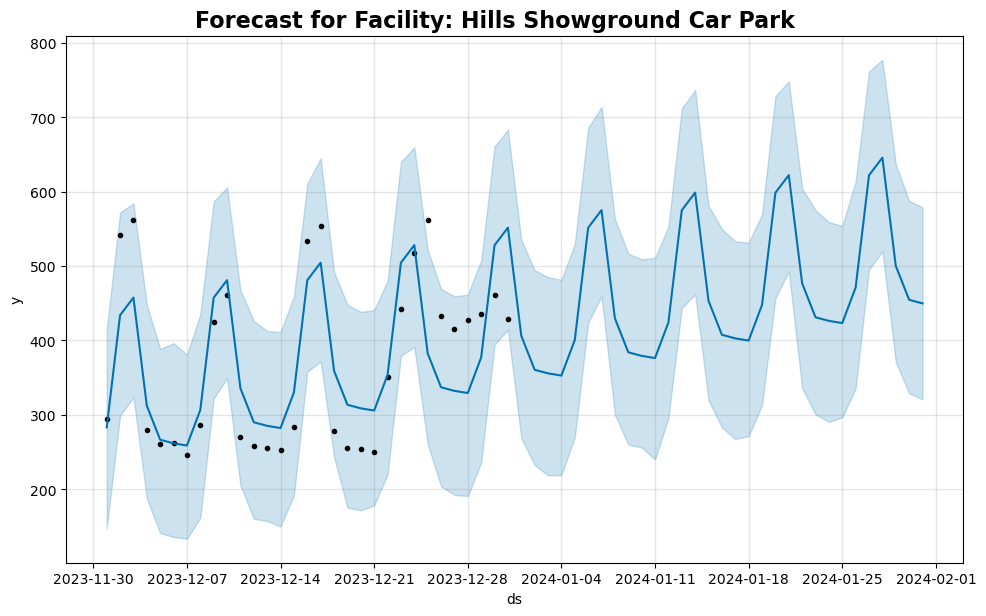

19:15:18 - cmdstanpy - INFO - Chain [1] start processing
19:15:18 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Hills Showground Car Park
MSE: 3691.9492597009335
RMSE: 60.761412588096846
MAE: 46.27444803089344




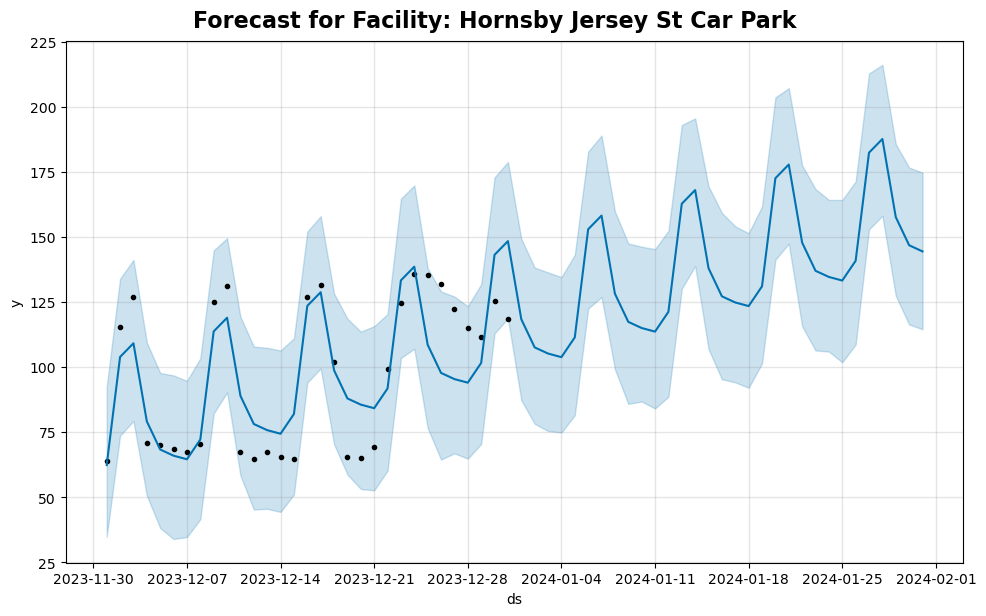

19:15:19 - cmdstanpy - INFO - Chain [1] start processing
19:15:19 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Hornsby Jersey St Car Park
MSE: 159.18512348974176
RMSE: 12.616858701346455
MAE: 10.20913733498735




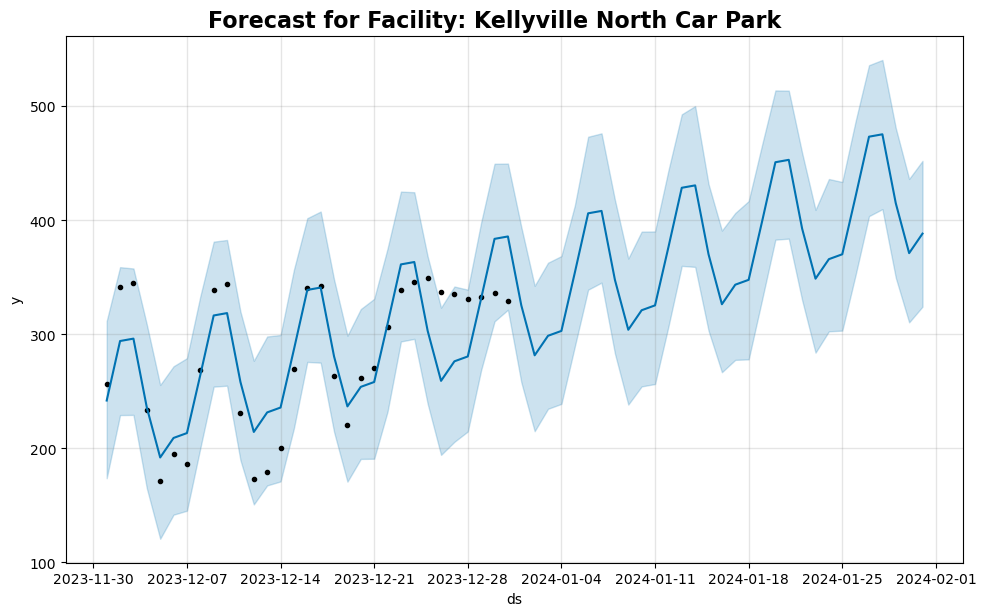

19:15:19 - cmdstanpy - INFO - Chain [1] start processing
19:15:19 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Kellyville North Car Park
MSE: 707.8154272540394
RMSE: 26.60480083094101
MAE: 21.709181947000182




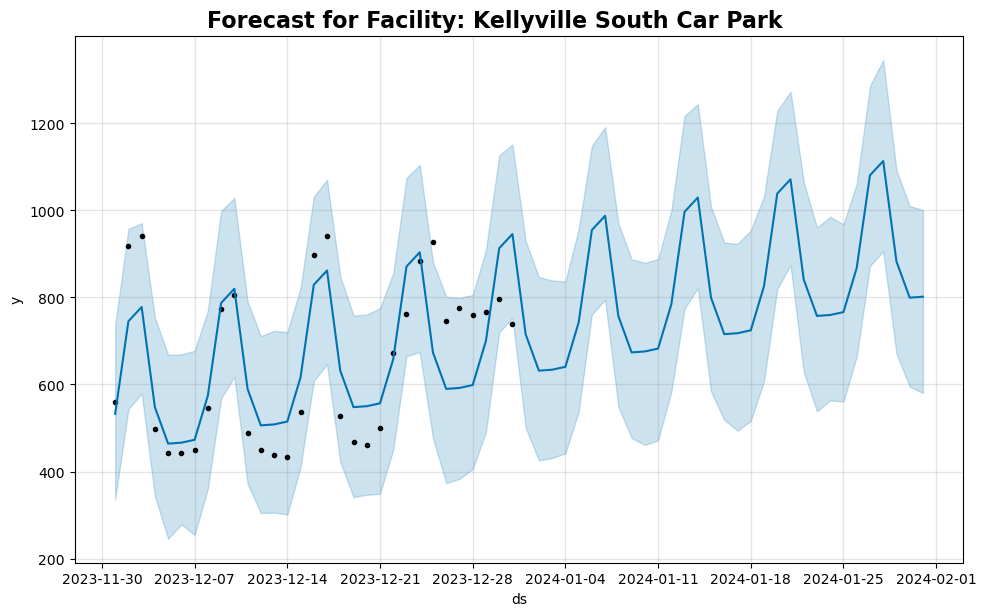

19:15:19 - cmdstanpy - INFO - Chain [1] start processing
19:15:20 - cmdstanpy - INFO - Chain [1] done processing


Metrics for Facility: Kellyville South Car Park
MSE: 8397.286454082237
RMSE: 91.6367090967492
MAE: 71.99651278704833




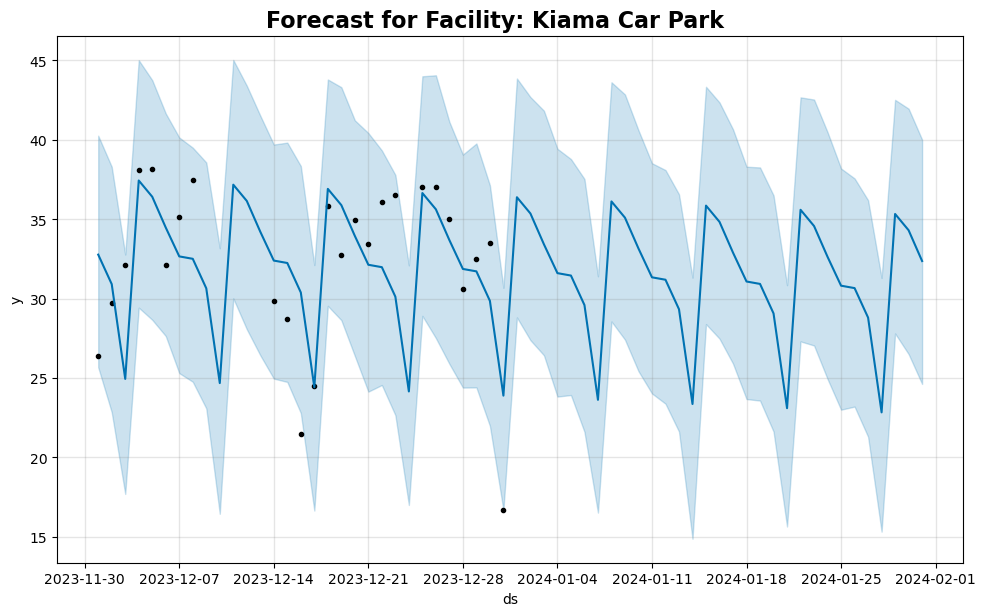

ValueError: Input contains NaN.

In [35]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Creating an empty dataframe
target = pd.DataFrame()

# Looping over facilities to perform forecasting
for facility in facility_names.groups:
    group = facility_names.get_group(facility)
    model = prophet.Prophet(interval_width=0.95)
    
    # Fit the model to the data
    model.fit(group)
    
    # Create a future DataFrame
    future = model.make_future_dataframe(periods=31)
    
    # Generate forecasts
    forecast = model.predict(future)
    
    # Plot the forecast with title
    fig = model.plot(forecast)
    fig.suptitle(f"Forecast for Facility: {facility}", y=1.02, fontsize=16, fontweight='bold')
    plt.show()
    
    # Calculate metrics using the first 25 values of actual data
    actual_values = group['y'][:25].values
    predicted_values = forecast[:25]['yhat'].values

    mse = mean_squared_error(actual_values, predicted_values)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual_values, predicted_values)
    
    # Print metrics for each facility
    print(f"Metrics for Facility: {facility}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAE: {mae}")
    print("\n")
    
    # Rename columns in the forecast DataFrame
    forecast = forecast.rename(columns={"yhat": f"yhat_{facility}", "ds": "ds_forecast"})
    
    # Drop unnecessary columns before merging
    forecast = forecast[["ds_forecast", f"yhat_{facility}"]]
    
    # Merge with updated column names
    target = pd.merge(target, forecast.set_index("ds_forecast"), how="outer", left_index=True, right_index=True)


The blackpoints on the plots are the actual `parking_availability` and the blue points  are the predicted values. The light blue background  represents the confidence interval which in our case is set to 95%

The dataframe above contains the forecast of the next 1 month based on the previous data the model has learned. We will plot the actual values versus the predicted values to see how  well our model is performing.

KeyError: 'yhat_West Ryde Car Park'

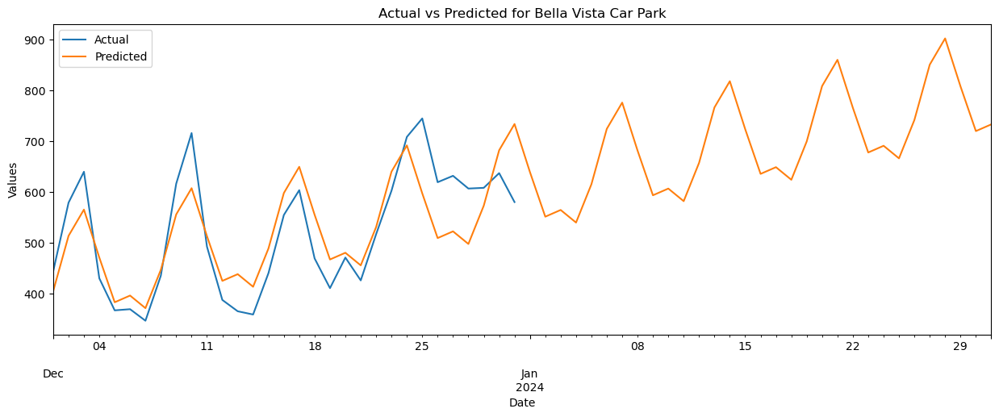

In [36]:
#facilities names
facility_names = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park",
                    "Warwick Farm Car Park", "Warriewood Car Park","Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park"]

# Loop through facility names
for facility in facility_names:
    # Get actual data for the facility from the original dataset
    actual_data = final_prophet_data.set_index("ds").query(f"facility_name == '{facility}'")["y"]

    # Get predicted data for the facility from the target DataFrame
    predicted_data = target[f"yhat_{facility}"]

    # Concatenate actual and predicted data
    combined_data = pd.concat([actual_data, predicted_data], axis=1)

    # Plot the actual vs predicted data 
    fig, ax = plt.subplots(figsize=(15, 5))
    combined_data.plot(ax=ax, title=f"Actual vs Predicted for {facility}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Values")
    ax.legend(["Actual", "Predicted"])


From the plots we can see our model recognizes the seasonality of our data although it doesn't recognize the peaks and this can suggest doing a multivariate analysis to incorporate other exogenous(external)  variables such as holidays and weather to see if our model will recognize the peaks

In [ ]:
import pickle

with open("model.pkl", "wb") as f:
    pickle.dump(model, f)


#### Multivariate Prophet modelling
As we saw in our initial model that the peaks couldn't be recognized when making predictions, we will go ahead and build another model that incorporates other external variables to see if the model will improve on realising the points it didn't recognize earlier 

In [ ]:
#our original dataframe
pprophet_data.head()

,date_time,facility_name,ParkID,zone_id,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1,1,1429,28,Friday,1401,Night,2.535373
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1,1,1429,27,Friday,1402,Night,2.537913
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1,1,1429,26,Friday,1403,Night,2.540453
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1,1,1429,25,Friday,1404,Night,2.542992
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1,1,1429,25,Friday,1404,Night,2.542992


In [ ]:
#setting datetime as index
second_prophet_data = pprophet_data.drop(["ParkID", "zone_id", "z_score", "time_category"], axis= 1)
#getting dummies
dummies_df = pd.get_dummies(second_prophet_data[['day_of_week']],
                            columns=["day_of_week"], prefix= ["day"])
#converting dummies to numerical
dummies_df = dummies_df.astype(int)
#joining the dummies and original df
final_df = pd.concat( [second_prophet_data, dummies_df] ,axis=1)
#dropping cat columns
final_df.drop( columns = "day_of_week", axis= 1, inplace = True)

In [ ]:

#inspecting our final df
final_df.head()


,date_time,facility_name,total_parking_spots,occupancy_total,parking_availability,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,1401,1,0,0,0,0,0,0
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,1402,1,0,0,0,0,0,0
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,1403,1,0,0,0,0,0,0
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,1404,1,0,0,0,0,0,0
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,1404,1,0,0,0,0,0,0


Now we have all columns in a format we can work with in machine learning. 

Lets resample the data into daily observations for easy handling

In [ ]:
#setting date to datetime
final_df['date_time'] = pd.to_datetime(final_df['date_time'])

# Set the datetime as index
final_df.set_index('date_time', inplace=True)
#resampling our data
final_data = final_df.groupby("facility_name").resample("D").mean()
#reset index
final_data = final_data.reset_index()

Renaming our columns in order to fit the prophet model

In [ ]:
#renaming columns
col_mapper  = {"date_time": "ds", "parking_availability": "y"}
#rename
final_data.rename(columns=col_mapper, inplace=True)
#inspecting
final_data.head()

,facility_name,ds,total_parking_spots,occupancy_total,y,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,Bella Vista Car Park,2023-12-01,777.0,332.854559,444.145441,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Bella Vista Car Park,2023-12-02,777.0,197.873521,579.126479,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,Bella Vista Car Park,2023-12-03,777.0,137.133550,639.866450,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Bella Vista Car Park,2023-12-04,777.0,346.532401,430.467599,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,Bella Vista Car Park,2023-12-05,777.0,409.501304,367.498696,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Instantiating prophet model so we can start modelling 

In [ ]:

#grouping by facility in order to get predictions for each
parking_lots = final_data.groupby("facility_name")


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of obser

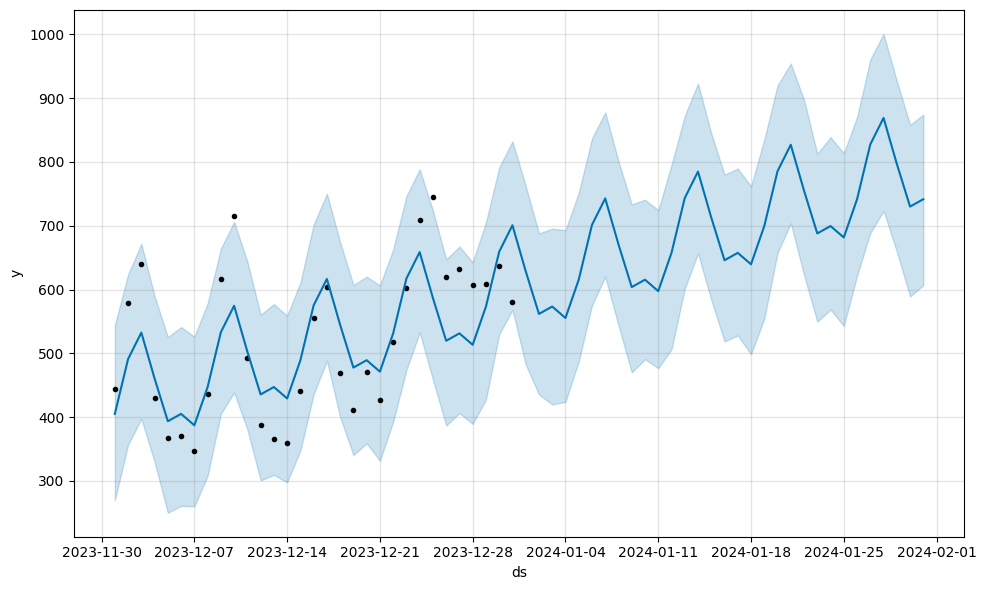

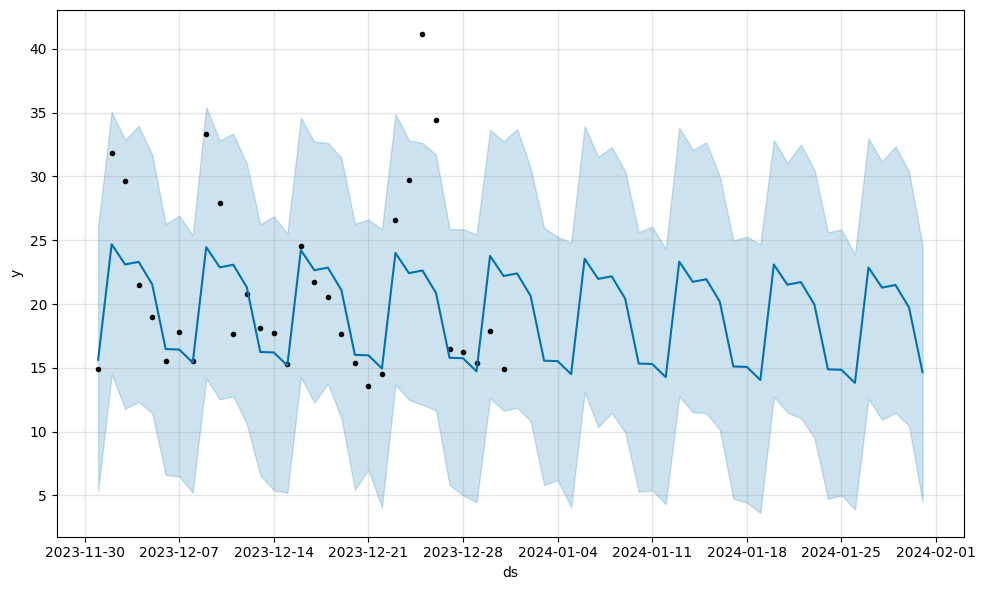

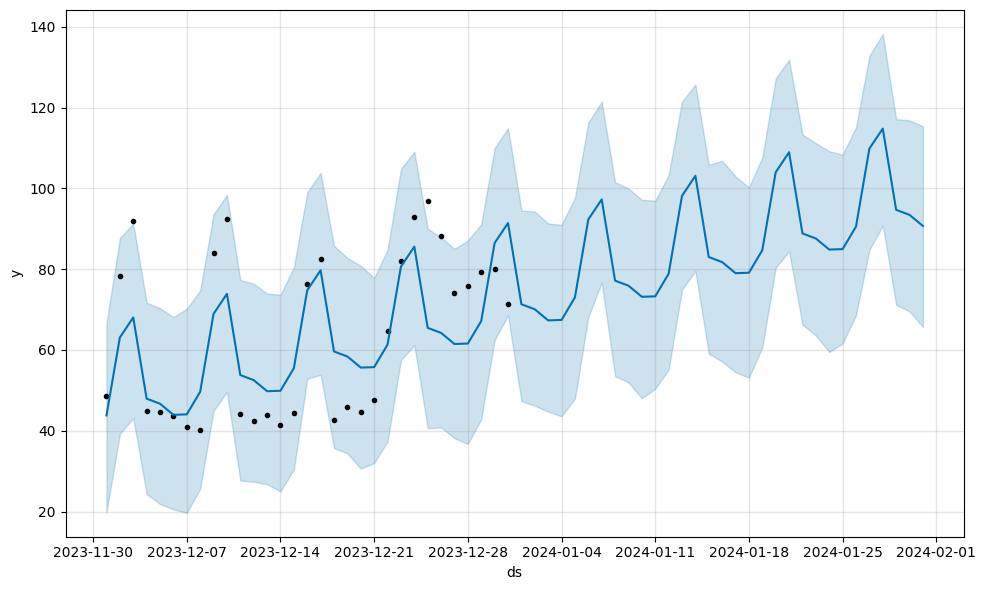

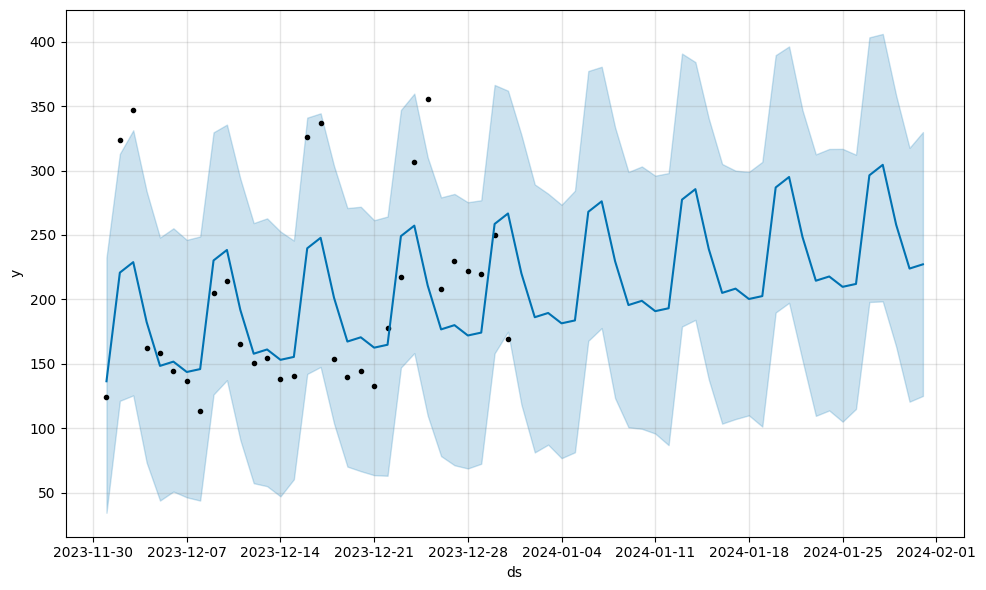

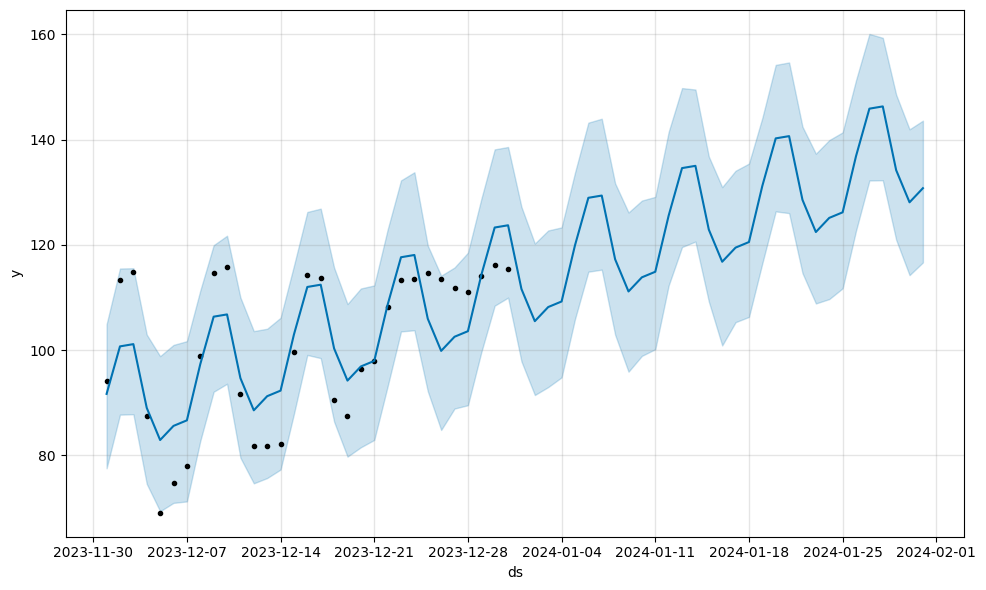

...

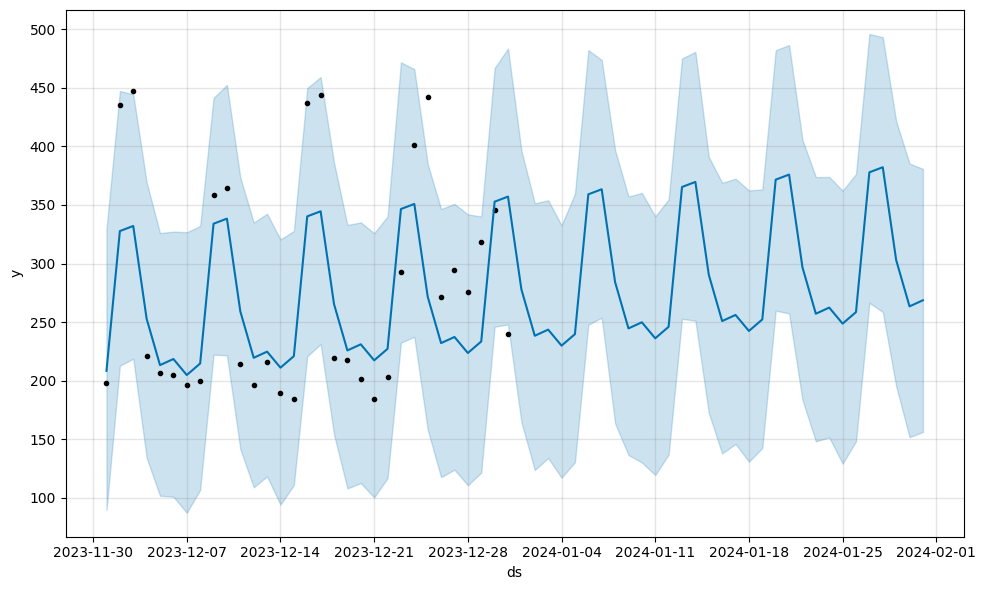

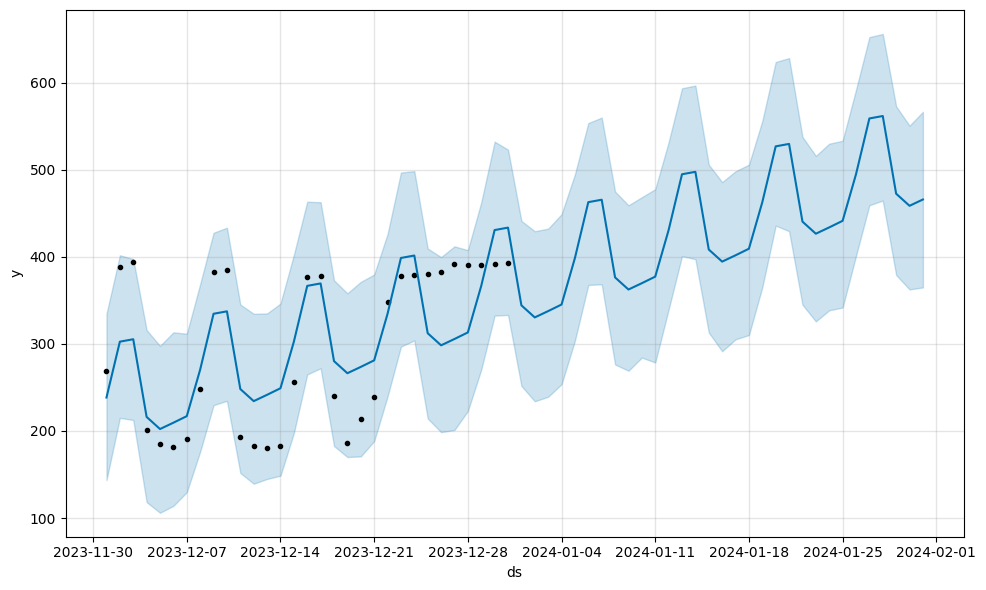

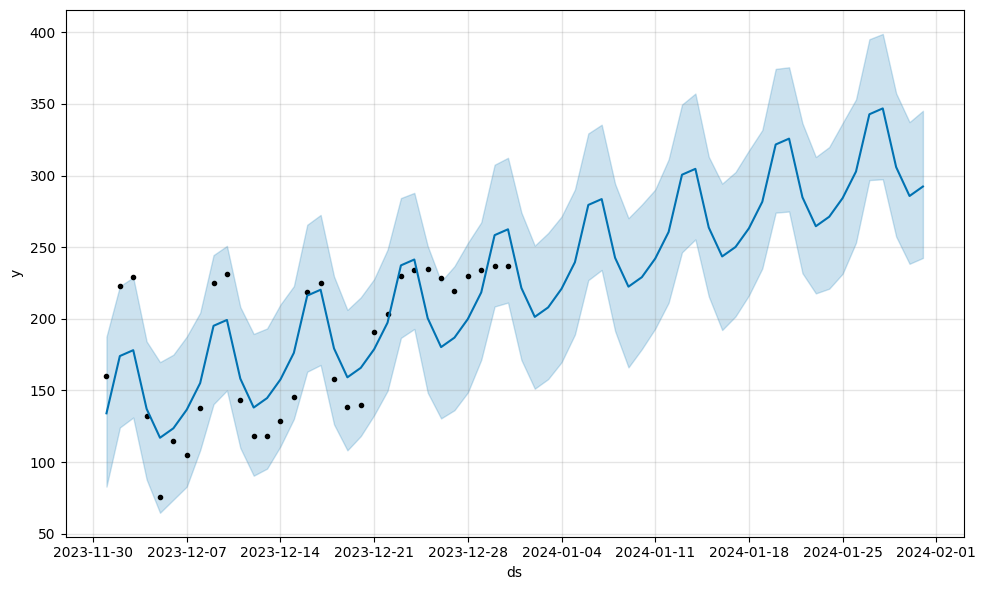

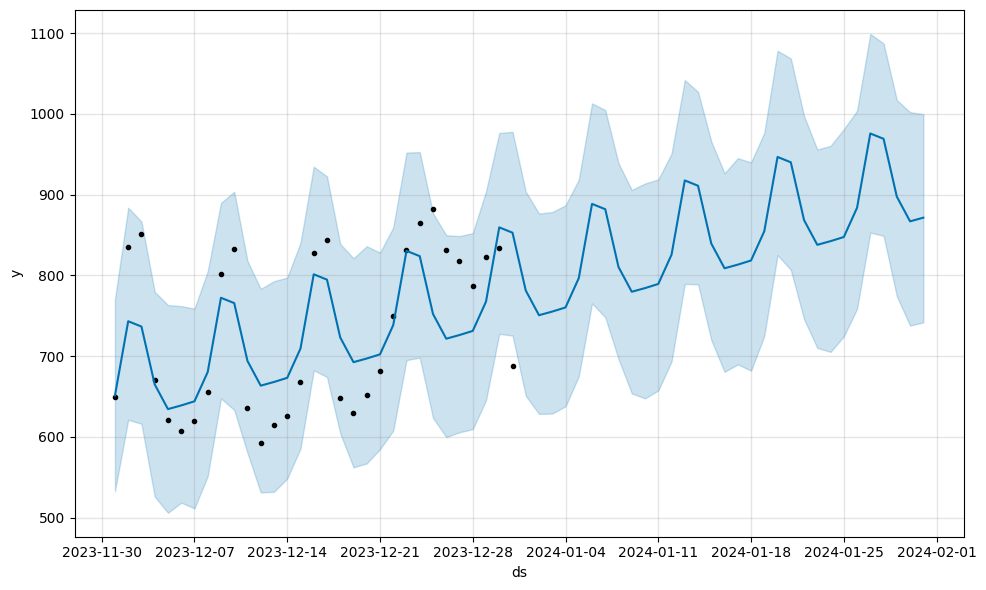

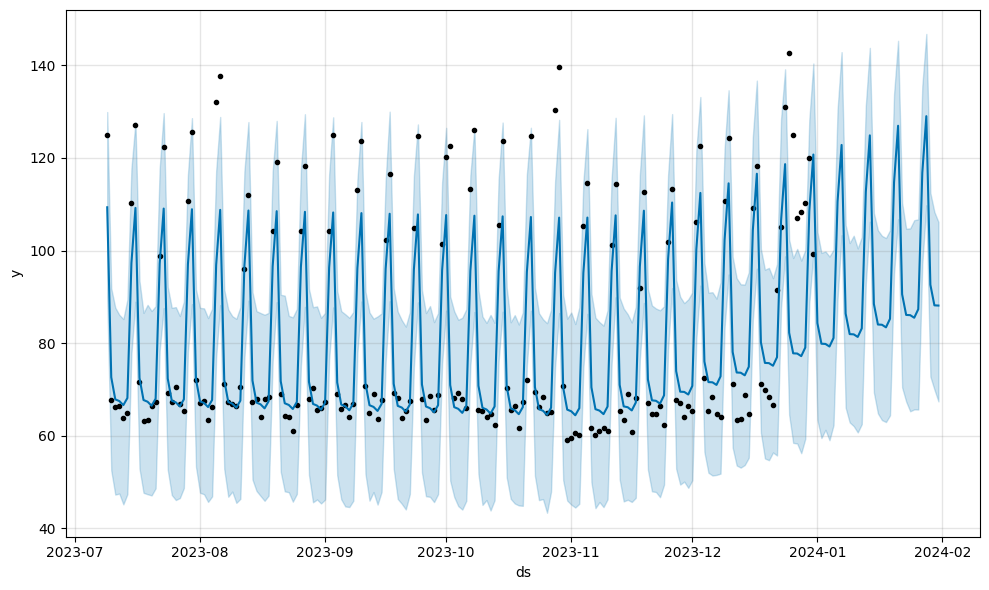

In [ ]:
# Creating an empty dataframe
second_target = pd.DataFrame()

# Looping over facilities to perform forecasting
for facility in parking_lots.groups:
    group = parking_lots.get_group(facility)
    
    # Instantiate the model
    prophet_model = prophet.Prophet(interval_width=0.95, daily_seasonality= False)
    
    #Adding regressors to the model
    for col in dummies_df.columns:
        prophet_model.add_regressor(col)
    
    # Fit the model to the data
    prophet_model.fit(group)
    
    # Create a future DataFrame with regressors
    future = prophet_model.make_future_dataframe(periods=31)
    
    for col in dummies_df.columns:
        future[col] = dummies_df[col]
    
    # Generate forecasts
    forecast = prophet_model.predict(future)
    final_data
    # Plot the forecast
    prophet_model.plot(forecast)
    
    # Rename columns in the forecast DataFrame
    forecast = forecast.rename(columns={"yhat": f"yhat_{facility}", "ds": "ds_forecast"})
    
    # Drop unnecessary columns before merging
    forecast = forecast[["ds_forecast", f"yhat_{facility}"]]
    
    # Merge with updated column names
    second_target = pd.merge(second_target, forecast.set_index("ds_forecast"), how="outer", left_index=True, right_index=True)


Plotting actual versus predicted

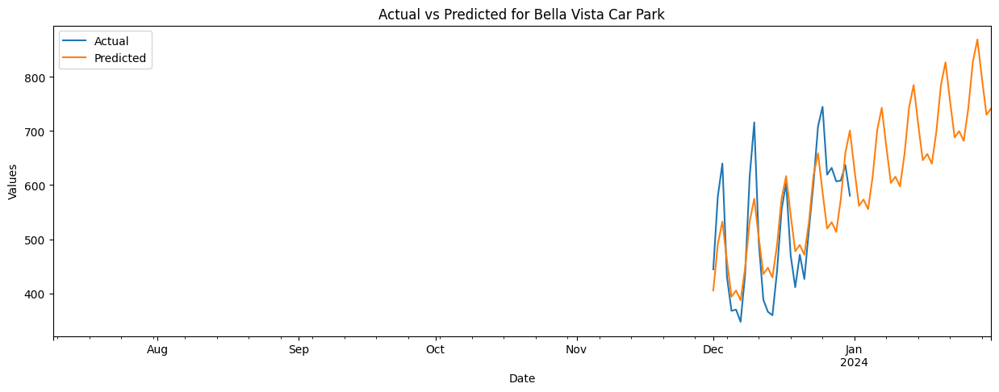

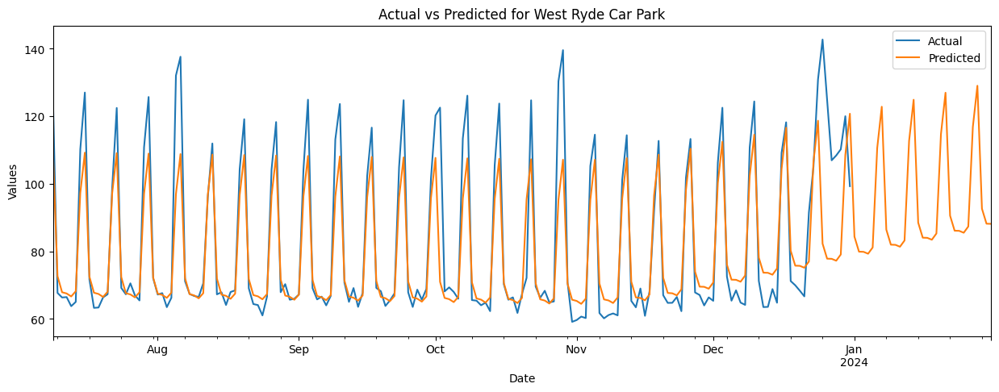

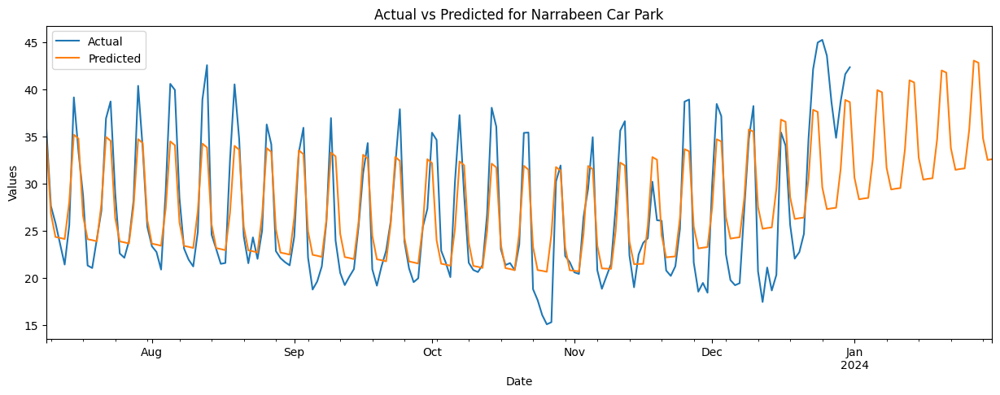

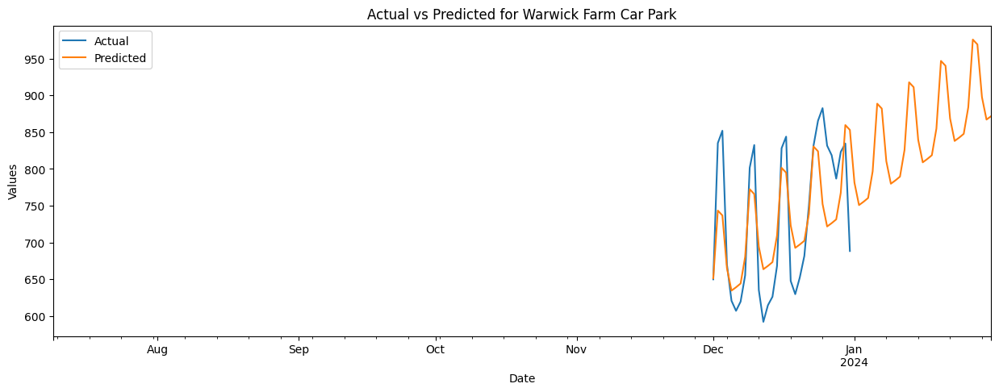

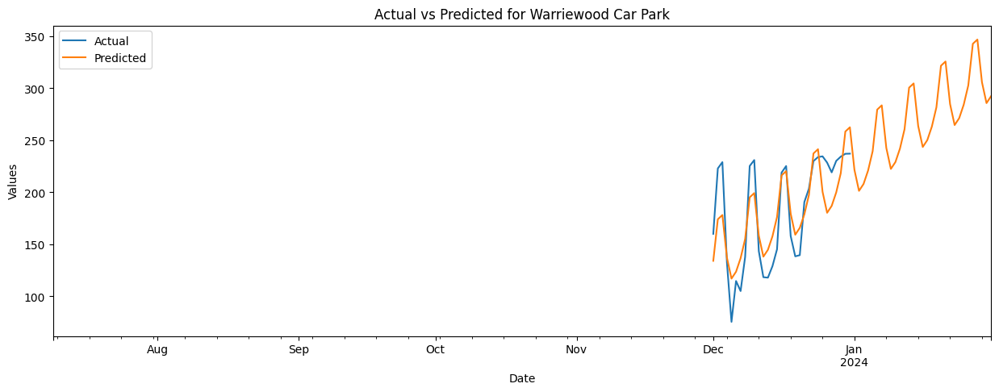

...

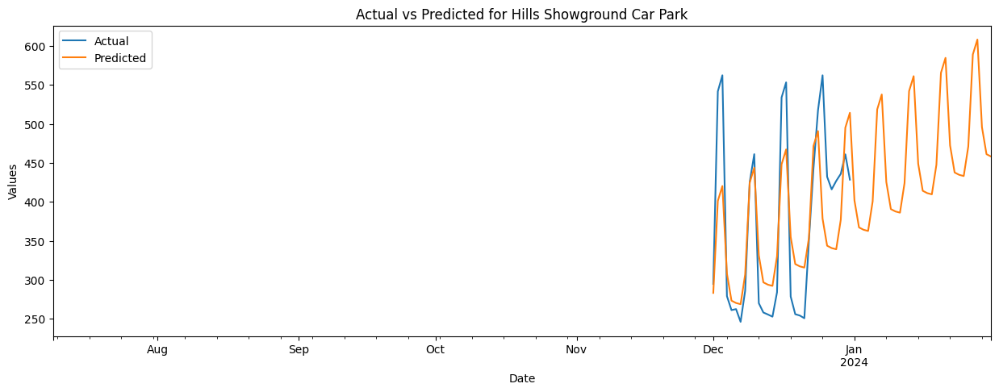

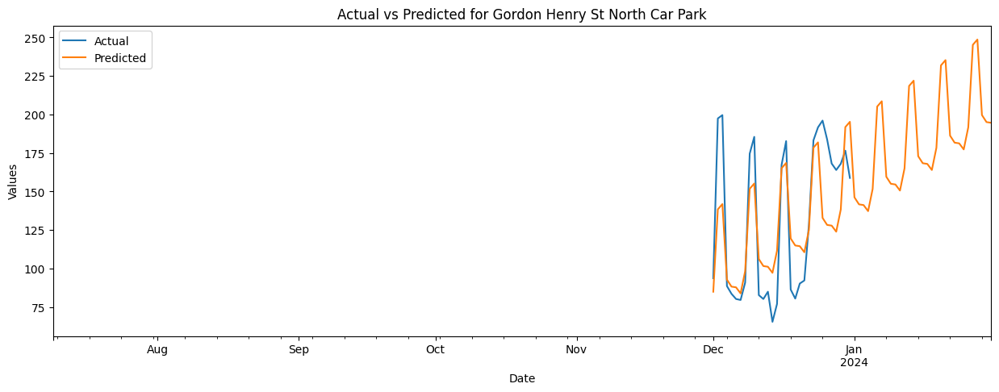

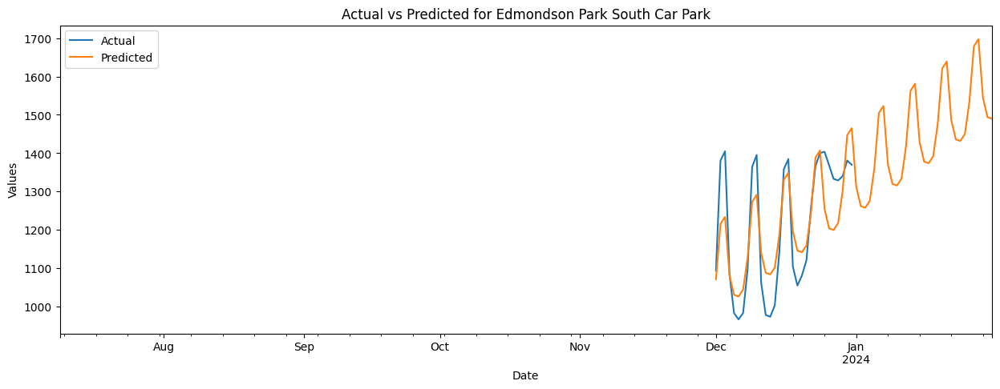

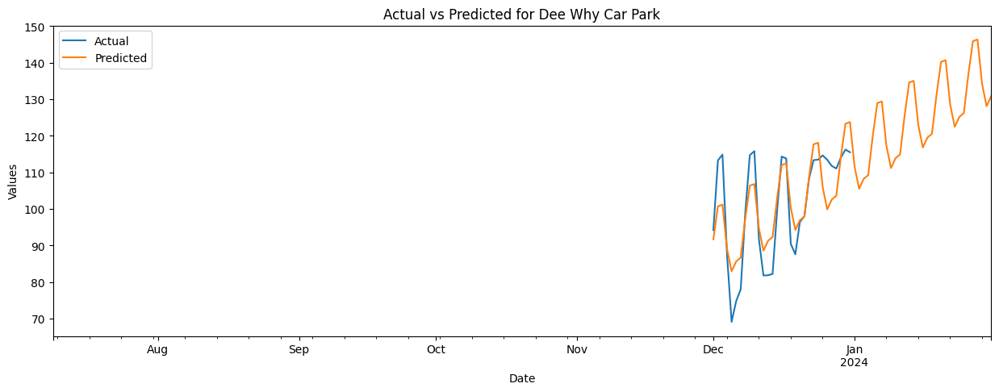

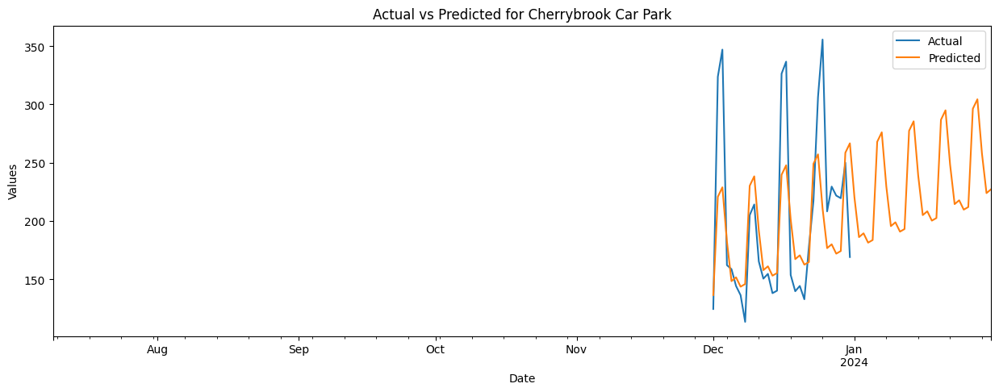

In [ ]:
#facilities names
facility_names = ["Bella Vista Car Park", "West Ryde Car Park", "Narrabeen Car Park",
                    "Warwick Farm Car Park", "Warriewood Car Park","Tallawong P2 Car Park",
                    "Tallawong P1 Car Park", "Sutherland East Parade Car Park", "St Marys Car Park", "Revesby Car Park",
                    "Penrith Combewood Multi-Level Car Park", "Penrith Combewood At-Grade Car Park", "Leppington Car Park",
                    "Kellyville South Car Park", "Kellyville North Car Park", "Hornsby Jersey St Car Park", "Hills Showground Car Park",
                    "Gordon Henry St North Car Park", "Edmondson Park South Car Park", "Dee Why Car Park", "Cherrybrook Car Park"]

# Loop through facility names
for facility in facility_names:
    # Get actual data for the facility from the original dataset
    actual_data = final_data.set_index("ds").query(f"facility_name == '{facility}'")["y"]

    # Get predicted data for the facility from the target DataFrame
    predicted_data = second_target[f"yhat_{facility}"]

    # Concatenate actual and predicted data
    combined_data = pd.concat([actual_data, predicted_data], axis=1)

    # Plot the actual vs predicted data 
    fig, ax = plt.subplots(figsize=(15, 5))
    combined_data.plot(ax=ax, title=f"Actual vs Predicted for {facility}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Values")
    ax.legend(["Actual", "Predicted"])

### XGBOOST for Time Series
XGBoost for time series involves transforming time-related features and historical observations into a structured input for the model. Incorporating relevant temporal information can enhance its ability to capture patterns, trends, and seasonality, improving forecasting accuracy. Experimentation with feature engineering and model parameters is crucial for optimizing performance in time series applications.

In [ ]:
#our initial dataframe
modelling_data.head()

,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
timestamp,,,,,,,
2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992


Since XGBOOST enjoys working with incorporated relevant temporal features, we are going to feature engineer our `timestamp`  column by creating new columns that capture the day of the week the hour of the day and minute

In [ ]:
#resetting index
xgboost_data = modelling_data.reset_index()
#inspecting the df
xgboost_data.head()

,timestamp,facility_name,total_parking_spots,occupancy_total,day_of_week,parking_availability,time_category,z_score
0,2023-12-01 00:09:20,Edmondson Park South Car Park,1429,28,Friday,1401,Night,2.535373
1,2023-12-01 00:12:57,Edmondson Park South Car Park,1429,27,Friday,1402,Night,2.537913
2,2023-12-01 00:13:45,Edmondson Park South Car Park,1429,26,Friday,1403,Night,2.540453
3,2023-12-01 00:17:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992
4,2023-12-01 00:27:43,Edmondson Park South Car Park,1429,25,Friday,1404,Night,2.542992


In [ ]:
#confirming timestamp dtype
print(xgboost_data["timestamp"].dtype)

datetime64[ns]


In [ ]:
vanilla_data =  xgboost_data.drop(["day_of_week", "time_category", "z_score"], axis= 1)
vanilla_data = vanilla_data.set_index("timestamp")


In [ ]:
xg_dummies = pd.get_dummies(xgboost_data[['day_of_week', 'time_category']],
                            columns=["day_of_week", "time_category"], prefix= ["day_of_the_week", "time_period"],
                            sparse= False, drop_first= True)
#converting dummies to numerical
xg_dummies = xg_dummies.astype(int)
#joining the dummies and original df
xg_encoded = pd.concat( [xgboost_data, xg_dummies] ,axis=1)
#dropping cat columns
xg_encode = xg_encoded.drop(["time_category", "day_of_week", "z_score"], axis= 1)
xg_encoded = xg_encoded.set_index("timestamp")

Mean Squared Error for Bella Vista Car Park: 1.0873900416333449
Root Mean Squared Error for Bella Vista Car Park: 1.0427799583964705
Mean Absolute Error for Bella Vista Car Park: 0.7654900099720163


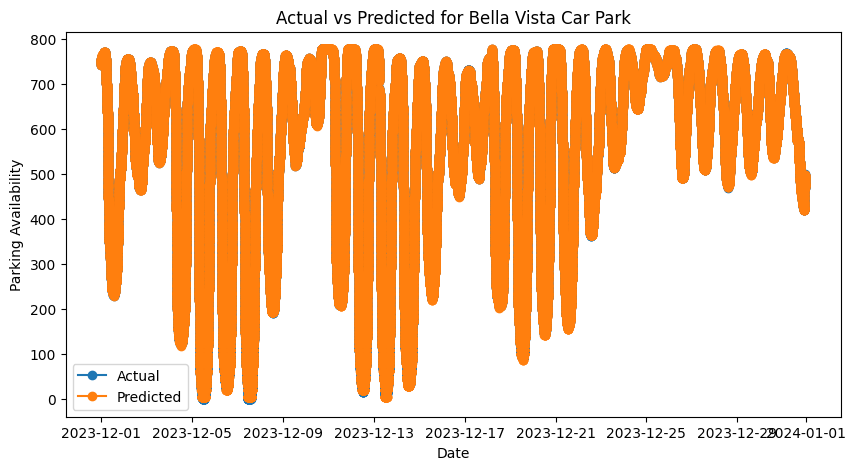

Mean Squared Error for Campbelltown Farrow Rd North Car Park: 8.773004197215277e-09
Root Mean Squared Error for Campbelltown Farrow Rd North Car Park: 9.366431656300747e-05
Mean Absolute Error for Campbelltown Farrow Rd North Car Park: 5.301955544854016e-05


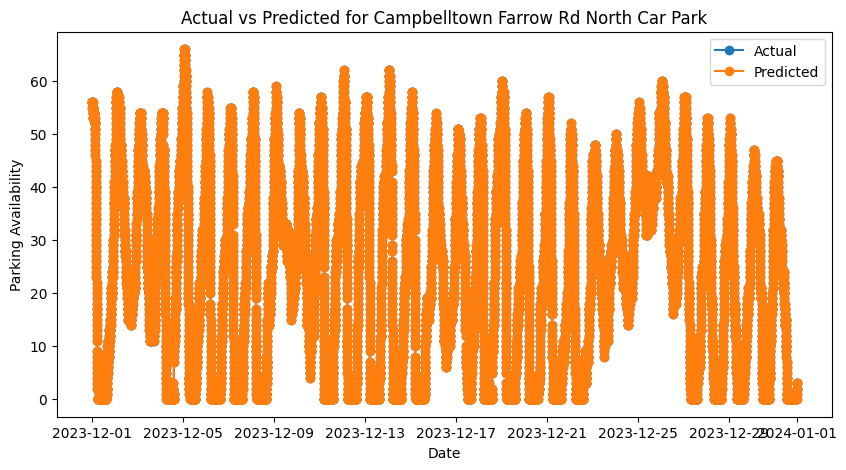

Mean Squared Error for Campbelltown Hurley Street South Car Park: 7.871259312502774e-08
Root Mean Squared Error for Campbelltown Hurley Street South Car Park: 0.00028055764670567747
Mean Absolute Error for Campbelltown Hurley Street South Car Park: 0.00018815494734341297


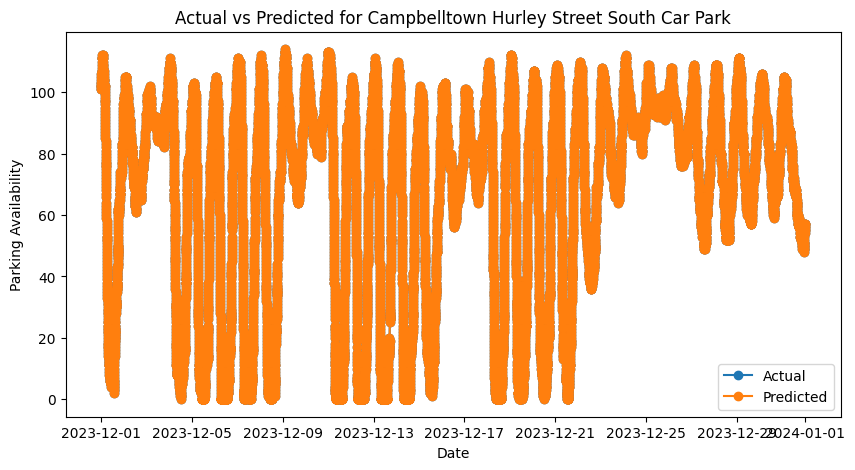

Mean Squared Error for Cherrybrook Car Park: 0.14566395137078178
Root Mean Squared Error for Cherrybrook Car Park: 0.38165947043245474
Mean Absolute Error for Cherrybrook Car Park: 0.28767078187608025


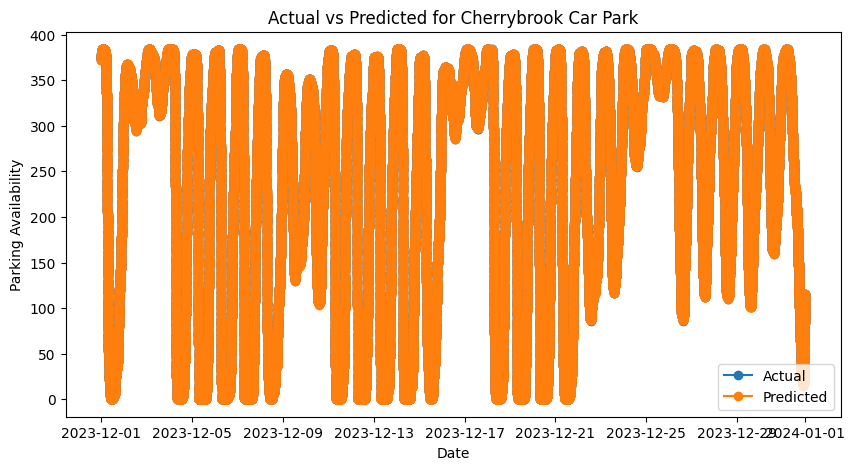

Mean Squared Error for Dee Why Car Park: 7.19700298049694e-08
Root Mean Squared Error for Dee Why Car Park: 0.0002682723053260798
Mean Absolute Error for Dee Why Car Park: 0.00012837214810914566


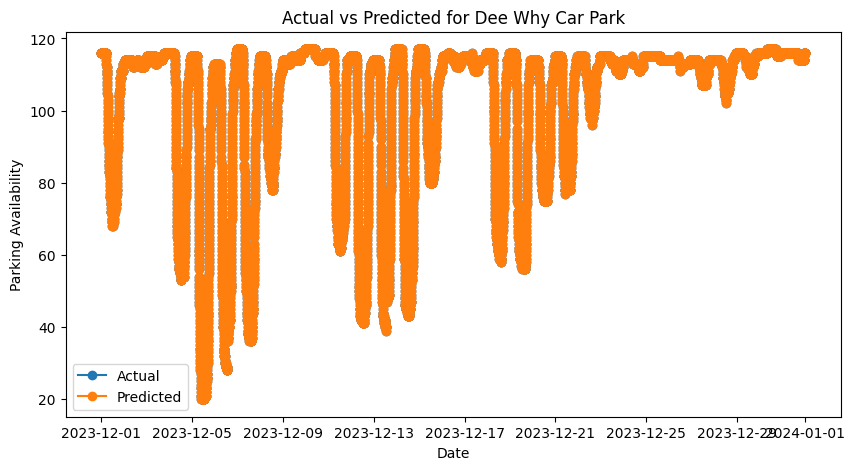

Mean Squared Error for Edmondson Park South Car Park: 12.31515968367512
Root Mean Squared Error for Edmondson Park South Car Park: 3.5092961806714347
Mean Absolute Error for Edmondson Park South Car Park: 0.8410380322873274


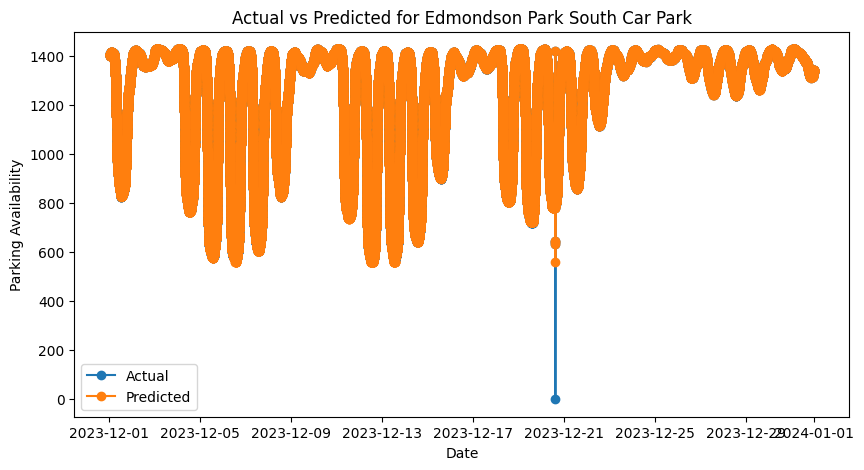

Mean Squared Error for Gordon Henry St North Car Park: 0.0004325822010208196
Root Mean Squared Error for Gordon Henry St North Car Park: 0.020798610555054383
Mean Absolute Error for Gordon Henry St North Car Park: 0.015222495729461171


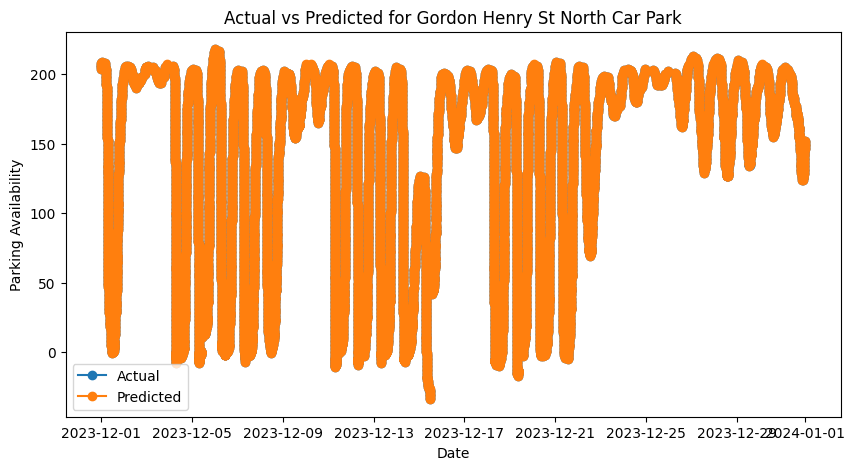

Mean Squared Error for Gosford Car Park: 2.470413093620721
Root Mean Squared Error for Gosford Car Park: 1.5717547816439819
Mean Absolute Error for Gosford Car Park: 0.9789851062495449


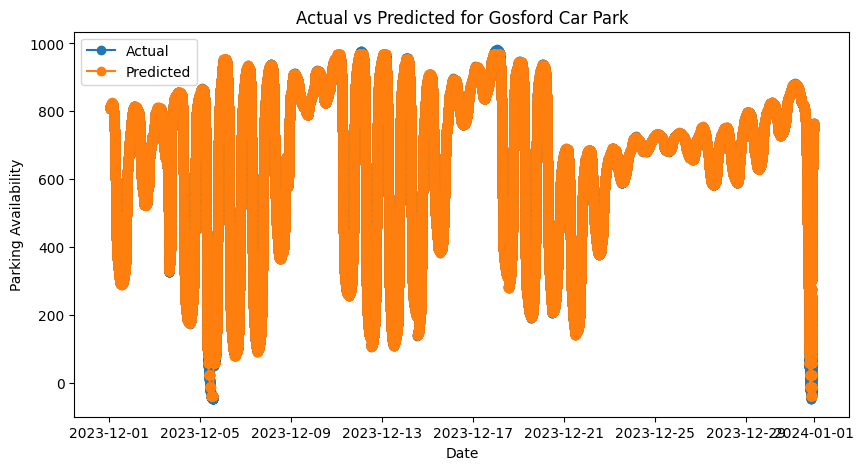

Mean Squared Error for Hills Showground Car Park: 0.4544482693515029
Root Mean Squared Error for Hills Showground Car Park: 0.6741277841414808
Mean Absolute Error for Hills Showground Car Park: 0.5270601175479139


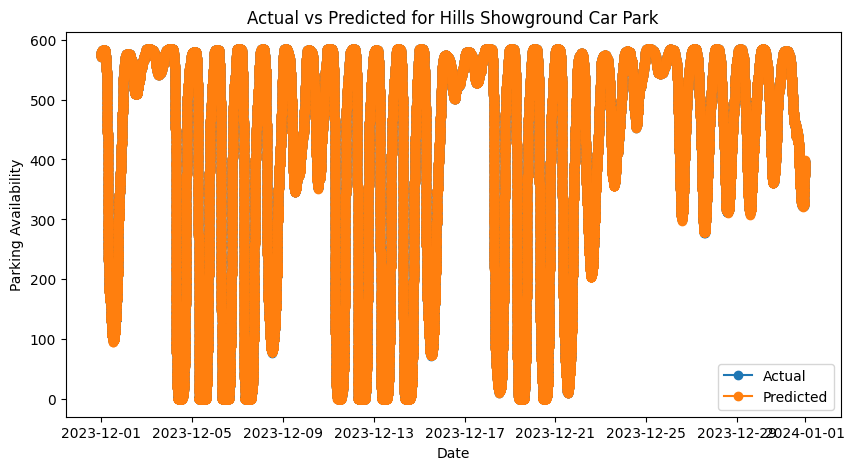

Mean Squared Error for Hornsby Jersey St Car Park: 1.0781471304806382e-06
Root Mean Squared Error for Hornsby Jersey St Car Park: 0.0010383386395972358
Mean Absolute Error for Hornsby Jersey St Car Park: 0.0007160092847347271


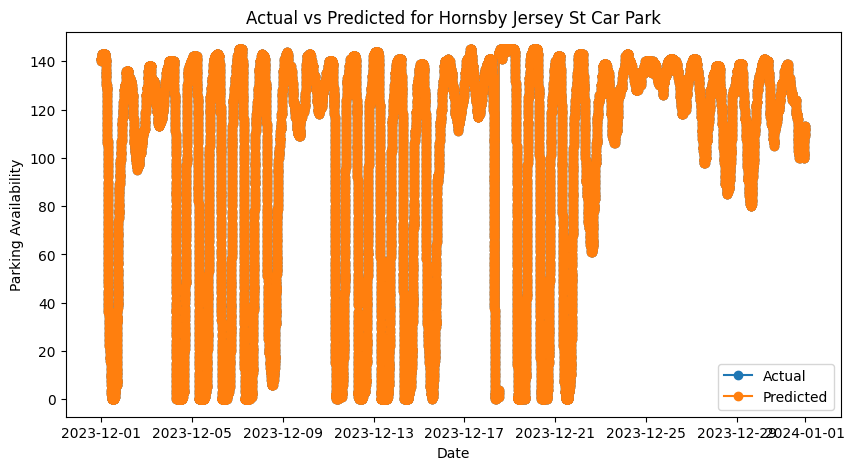

Mean Squared Error for Kellyville North Car Park: 0.2207312563968406
Root Mean Squared Error for Kellyville North Car Park: 0.46982045123306476
Mean Absolute Error for Kellyville North Car Park: 0.2645464027388773


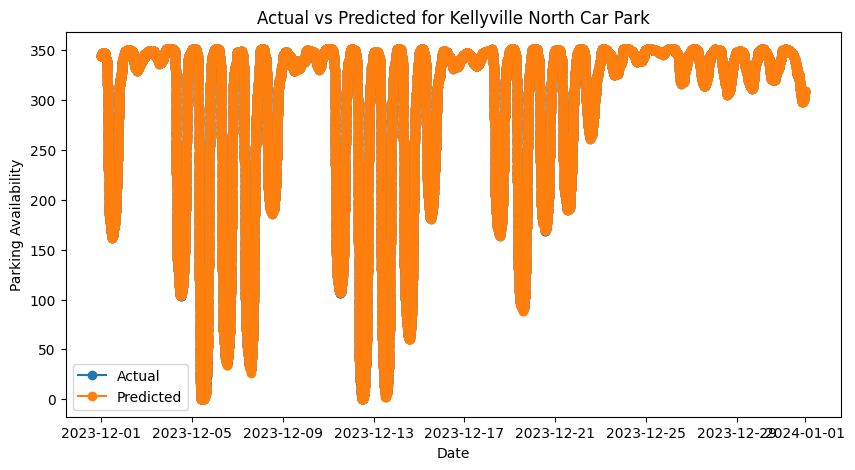

Mean Squared Error for Kellyville South Car Park: 1.3817655929293275
Root Mean Squared Error for Kellyville South Car Park: 1.1754852584908615
Mean Absolute Error for Kellyville South Car Park: 0.9220440052541207


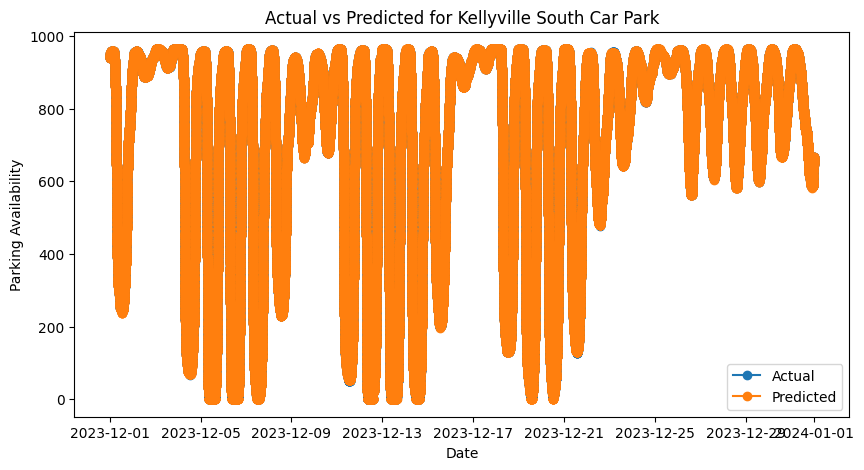

Mean Squared Error for Kiama Car Park: 1.8528248783411874e-07
Root Mean Squared Error for Kiama Car Park: 0.0004304445235266895
Mean Absolute Error for Kiama Car Park: 0.000285228905995197


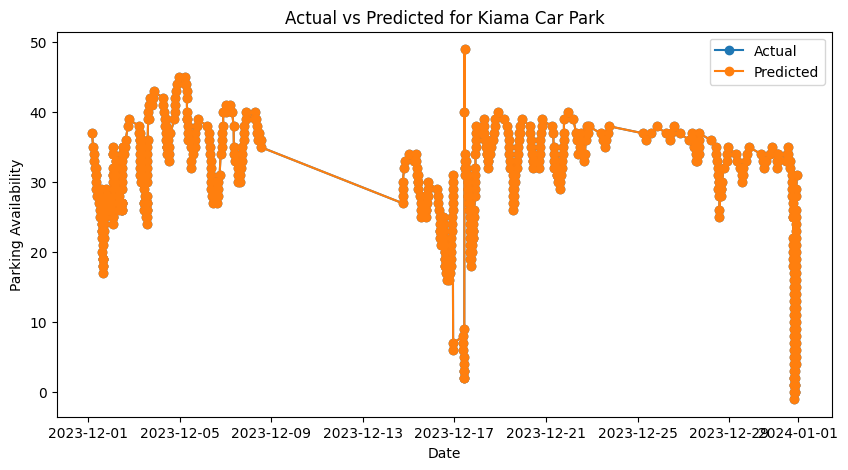

Mean Squared Error for Leppington Car Park: 3.0078385401480654
Root Mean Squared Error for Leppington Car Park: 1.7343121230470786
Mean Absolute Error for Leppington Car Park: 1.3267193379110311


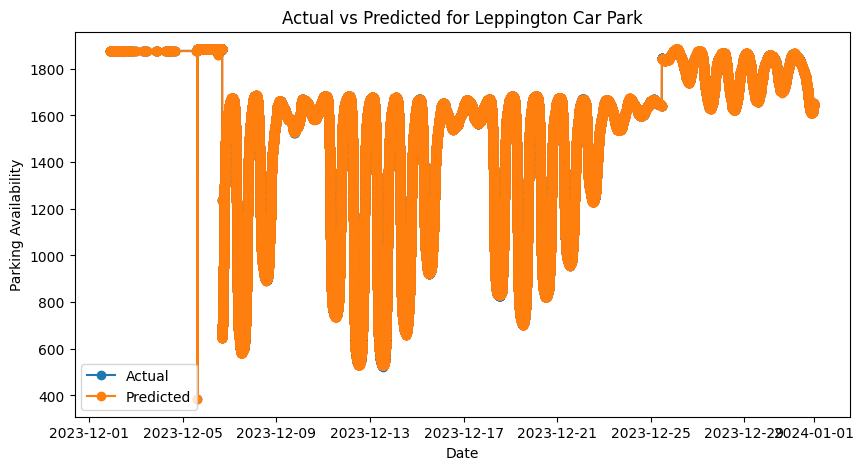

Mean Squared Error for Mona Vale Car Park: 5.2311576044638943e-08
Root Mean Squared Error for Mona Vale Car Park: 0.00022871724037474512
Mean Absolute Error for Mona Vale Car Park: 0.0001693348985509819


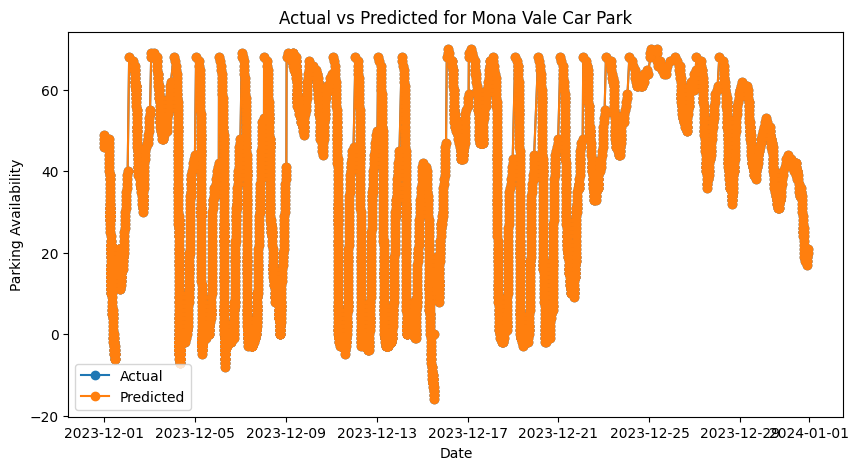

Mean Squared Error for Narrabeen Car Park: 3.551279810509899e-11
Root Mean Squared Error for Narrabeen Car Park: 5.95926154024968e-06
Mean Absolute Error for Narrabeen Car Park: 4.3204385155615644e-06


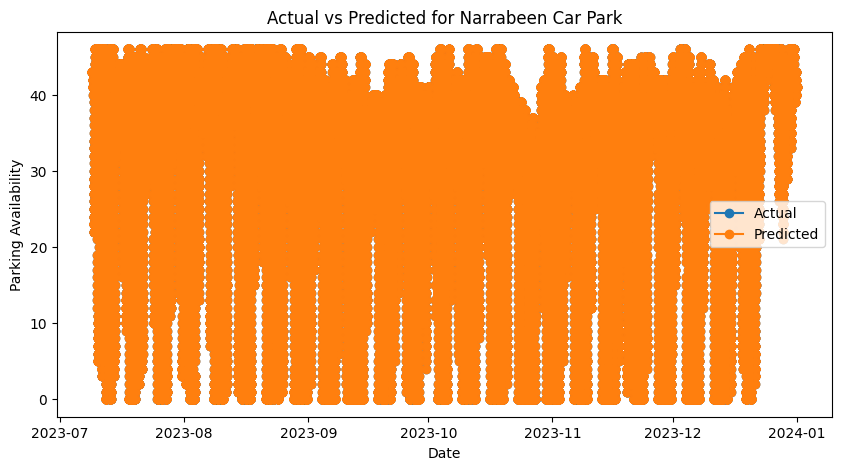

Mean Squared Error for Penrith Combewood At-Grade Car Park: 1.7440170723537124e-07
Root Mean Squared Error for Penrith Combewood At-Grade Car Park: 0.0004176143043950617
Mean Absolute Error for Penrith Combewood At-Grade Car Park: 0.00022982784311345277


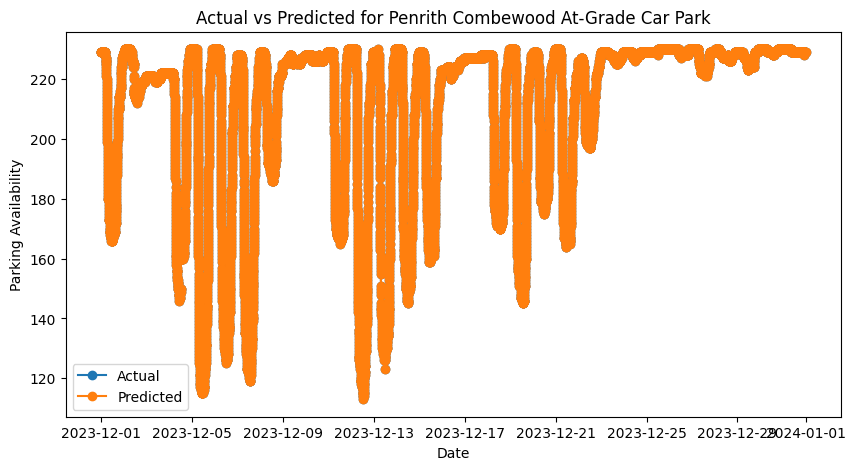

Mean Squared Error for Penrith Combewood Multi-Level Car Park: 1.038967869062361
Root Mean Squared Error for Penrith Combewood Multi-Level Car Park: 1.0192977332763773
Mean Absolute Error for Penrith Combewood Multi-Level Car Park: 0.685587444183272


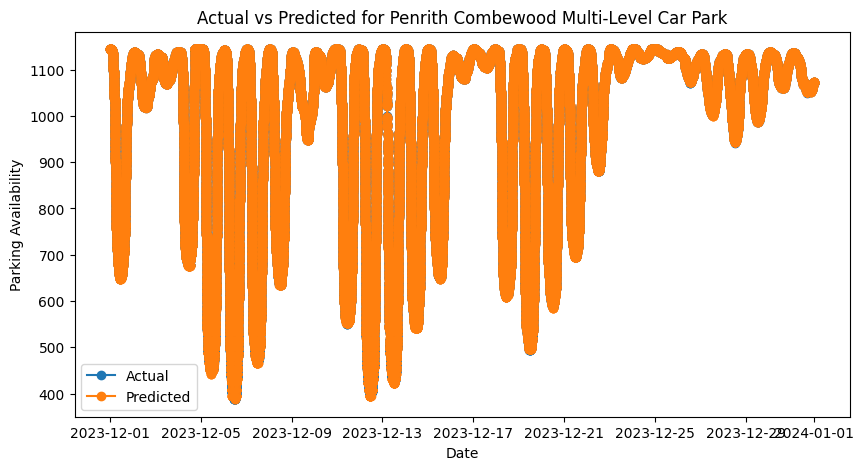

Mean Squared Error for Revesby Car Park: 0.6730565251478574
Root Mean Squared Error for Revesby Car Park: 0.8204002225425451
Mean Absolute Error for Revesby Car Park: 0.47495560355808425


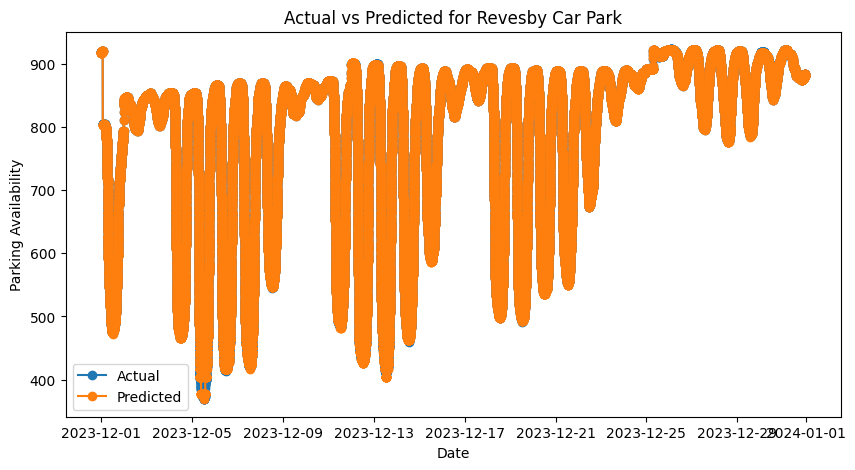

Mean Squared Error for Schofields Car Park: 0.7673197984945661
Root Mean Squared Error for Schofields Car Park: 0.8759679209277964
Mean Absolute Error for Schofields Car Park: 0.6020469493224108


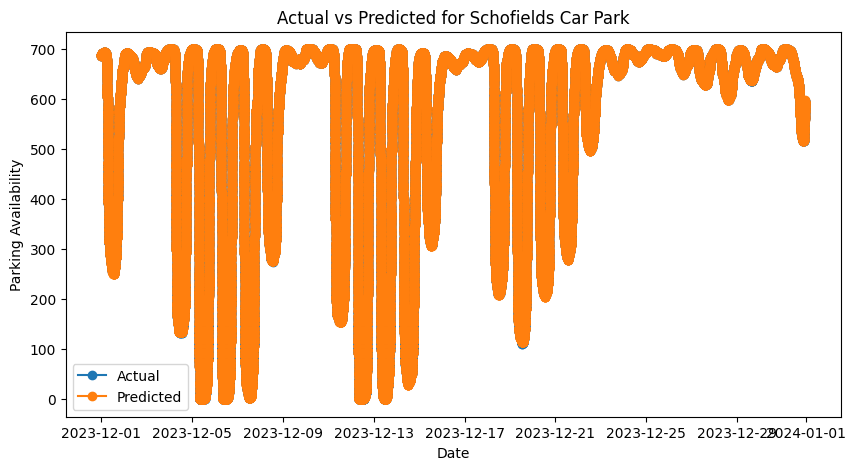

Mean Squared Error for St Marys Car Park: 0.4427026211999466
Root Mean Squared Error for St Marys Car Park: 0.6653590167721082
Mean Absolute Error for St Marys Car Park: 0.4132831995051919


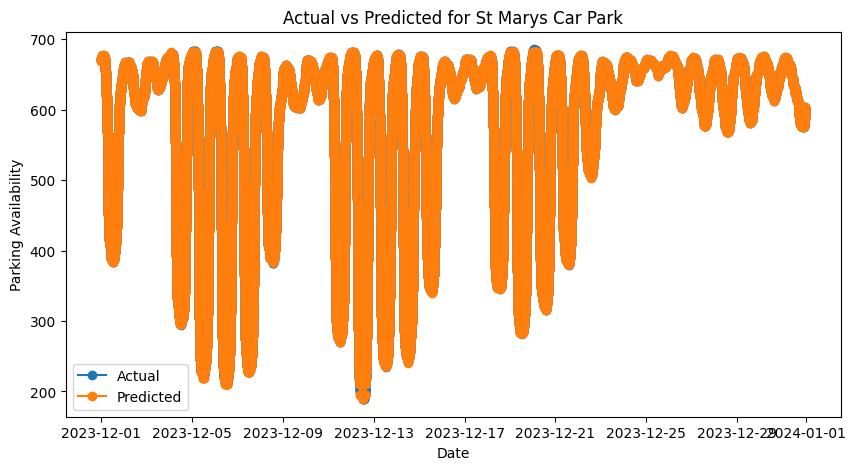

Mean Squared Error for Sutherland East Parade Car Park: 0.23544046147853662
Root Mean Squared Error for Sutherland East Parade Car Park: 0.48522207439329945
Mean Absolute Error for Sutherland East Parade Car Park: 0.2900536714161523


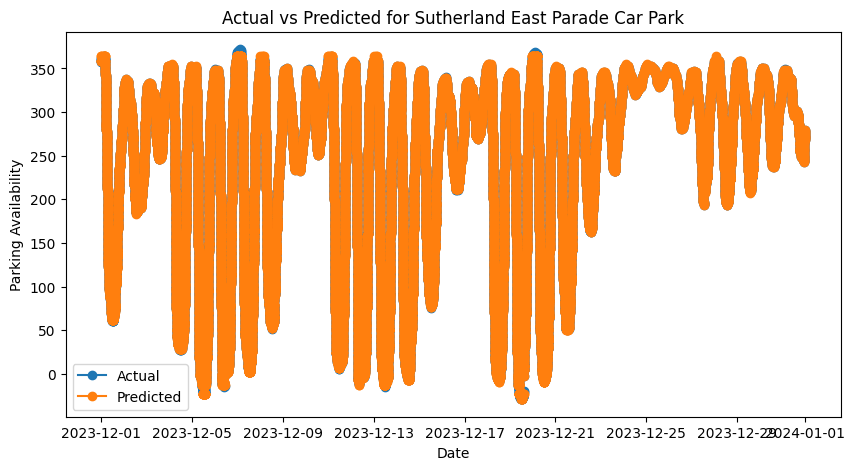

Mean Squared Error for Tallawong P1 Car Park: 4.2007409764994234e-08
Root Mean Squared Error for Tallawong P1 Car Park: 0.00020495709249741576
Mean Absolute Error for Tallawong P1 Car Park: 0.000144051177030416


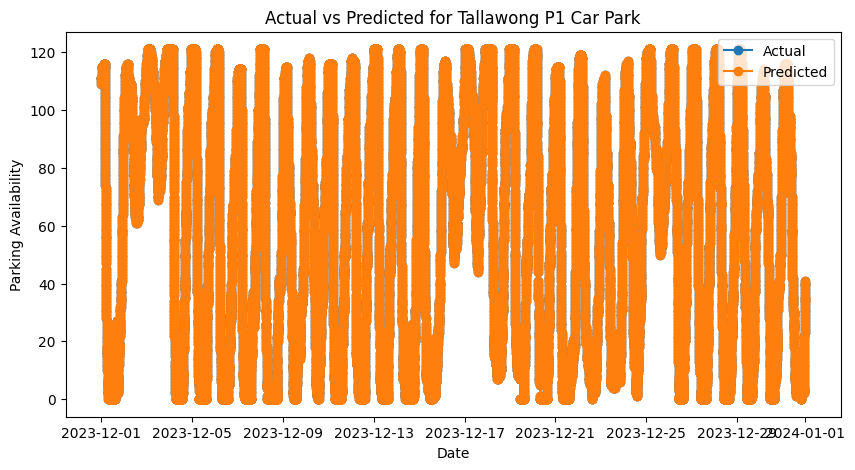

Mean Squared Error for Tallawong P2 Car Park: 0.2375146168825684
Root Mean Squared Error for Tallawong P2 Car Park: 0.4873547136148048
Mean Absolute Error for Tallawong P2 Car Park: 0.383869051941189


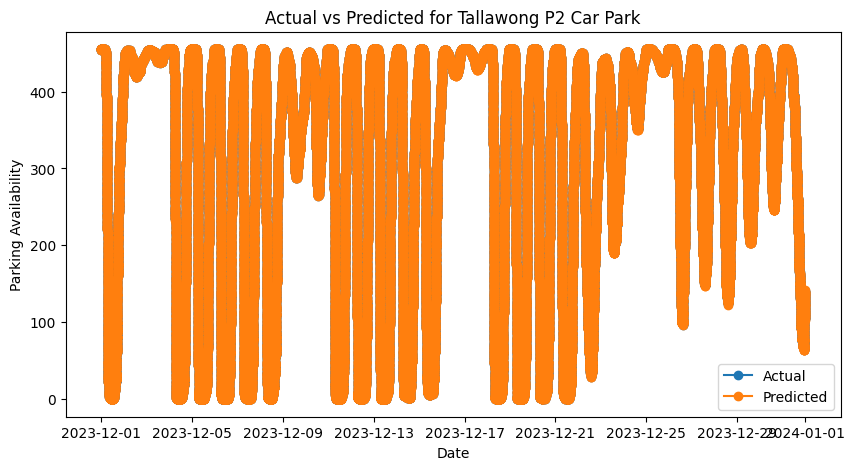

Mean Squared Error for Tallawong P3 Car Park: 0.20123690408446374
Root Mean Squared Error for Tallawong P3 Car Park: 0.44859436474889397
Mean Absolute Error for Tallawong P3 Car Park: 0.33796579734941434


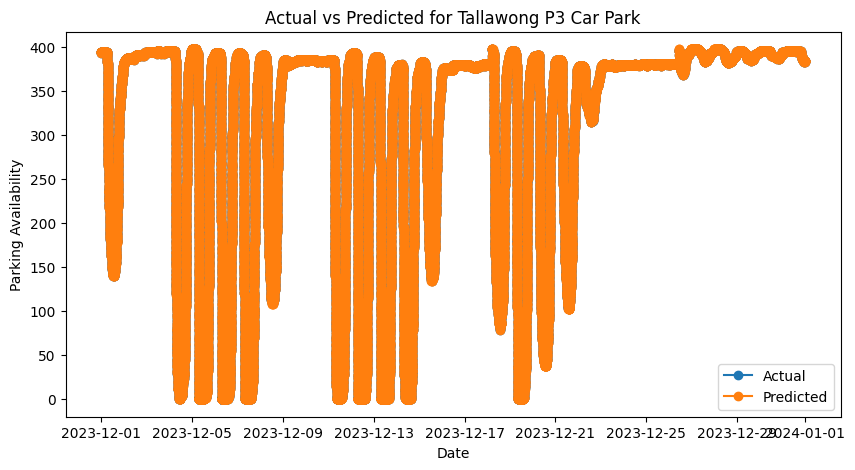

Mean Squared Error for Warriewood Car Park: 0.18682023718249094
Root Mean Squared Error for Warriewood Car Park: 0.43222706669352734
Mean Absolute Error for Warriewood Car Park: 0.1105471908413634


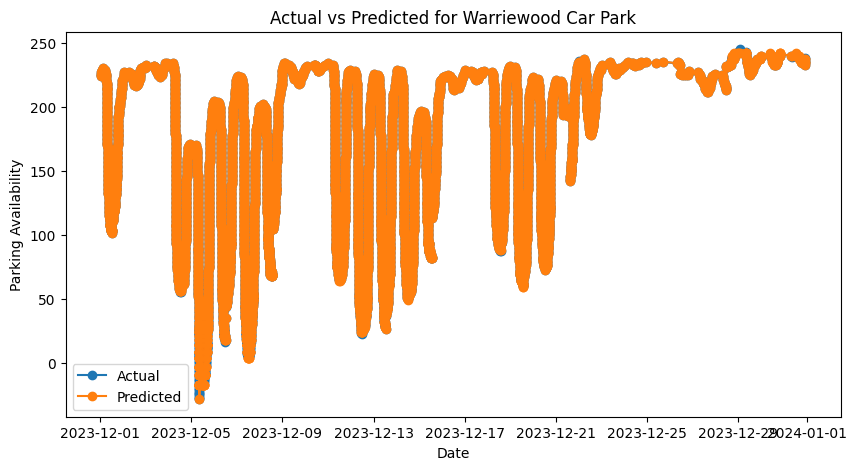

Mean Squared Error for Warwick Farm Car Park: 0.6310624527116365
Root Mean Squared Error for Warwick Farm Car Park: 0.7943943936808948
Mean Absolute Error for Warwick Farm Car Park: 0.5100274683191622


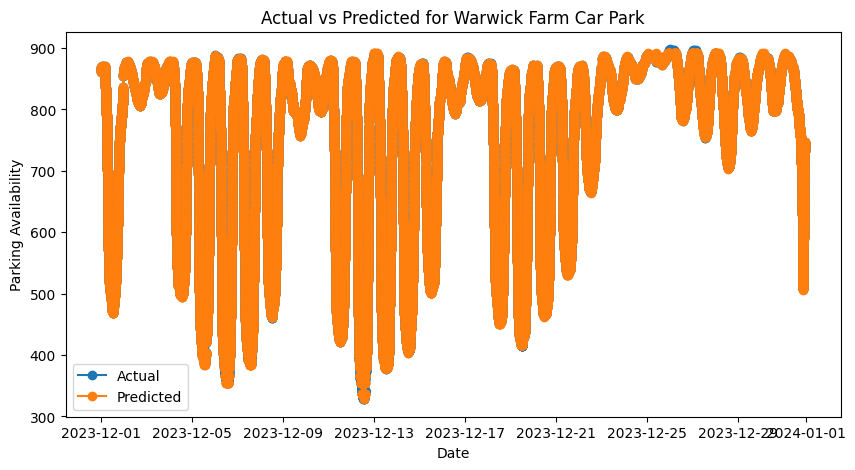

Mean Squared Error for West Ryde Car Park: 1.7946348311400227e-08
Root Mean Squared Error for West Ryde Car Park: 0.00013396398139574767
Mean Absolute Error for West Ryde Car Park: 9.849439603403362e-05


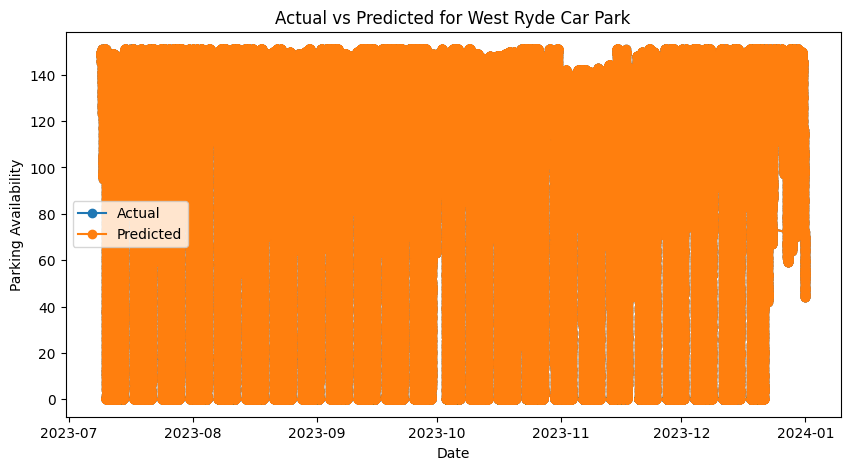

In [ ]:
vanilla_data =  xgboost_data.drop(["day_of_week", "time_category", "z_score"], axis= 1)
vanilla_data = vanilla_data.set_index("timestamp")

xg_grouped = vanilla_data.groupby("facility_name")

import xgboost as xgb
from datetime import timedelta

# Dictionary to store XGBoost models for each parking lot
xg_models = {}

# Train a model for each parking lot
for facility_name, group_data in xg_grouped:
    # Split the data into features and target variable
    X = group_data.drop(columns=["parking_availability", "facility_name"], axis=1)
    y = group_data["parking_availability"]

    # Create an XGBoost model
    xg_model = xgb.XGBRegressor(objective='reg:squarederror')

    # Train the model
    xg_model.fit(X, y)

    # Make predictions on the entire dataset
    group_data["prediction"] = xg_model.predict(X)

    # Evaluate the model
    mse = mean_squared_error(y, group_data["prediction"])
    rmse = sqrt(mse)
    mae = mean_absolute_error(y,group_data["prediction"])
    print(f'Mean Squared Error for {facility_name}: {mse}')
    print(f'Root Mean Squared Error for {facility_name}: {rmse}')
    print(f'Mean Absolute Error for {facility_name}: {mae}')
    # Store the trained model in the dictionary
    xg_models[facility_name] = xg_model

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 5))
    plt.plot(group_data.index, y, label='Actual', marker='o')
    plt.plot(group_data.index, group_data["prediction"], label='Predicted', marker='o')
    plt.title(f'Actual vs Predicted for {facility_name}')
    plt.xlabel('Date')
    plt.ylabel('Parking Availability')
    plt.legend()
    plt.show()

Our model is learning too perfectly from the training data such that we cannot see the plot of actual data points because they have been covered by the predicted values.

We will add some few other columns and penalties to see if it will improve

Now that we have our best parameters for the Xgboost model. We are going to build final models for each time series and make predictions with it.


------------------------------


ValueError: x and y must have same first dimension, but have shapes (35473,) and (1,)

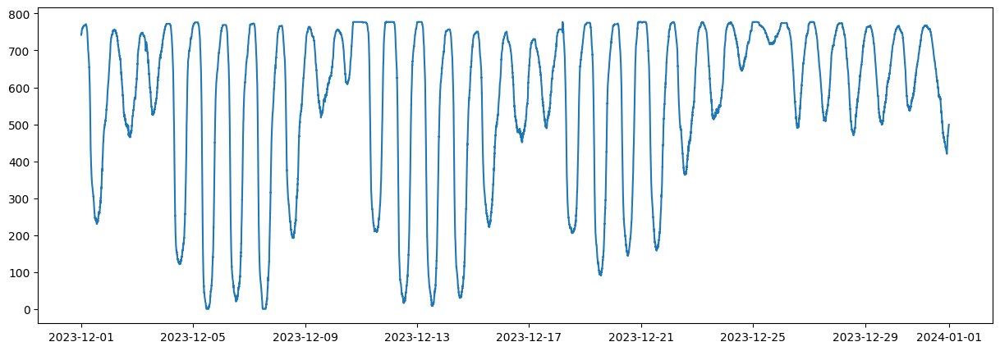

In [ ]:
# Define the parameter grid for GridSearchCV
param_grid = { 
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7],
    "gamma": [0, 0.1, 0.2],
    "lambda": [0.01,  0.1],
    "alpha": [0.01, 0.1, 0.2],
    "n_estimators": [20, 40, 50]
}
#class XGBOOST
class XGBoostTimeSeriesModel:
    def __init__(self, param_grid, target_variable='parking_availability', cv=3, n_jobs=-1):
        self.param_grid = param_grid
        self.target_variable = target_variable
        self.cv = cv
        self.n_jobs = n_jobs
        self.models = {}

    def _get_features_target(self, group_data):
        X = group_data.drop(columns=[self.target_variable, "facility_name"], axis=1)
        y = group_data[self.target_variable]
        return X, y

    def train_models(self, xg_grouped):
        for facility_name, group_data in xg_grouped:
            X, y = self._get_features_target(group_data)

            # Create an XGBoost model
            xg_model = xgb.XGBRegressor(objective='reg:squarederror')

            # Perform GridSearchCV
            grid_search = GridSearchCV(xg_model, param_grid=self.param_grid, cv=self.cv, n_jobs=self.n_jobs)
            grid_search.fit(X, y)

            # Get the best hyperparameters
            best_params = grid_search.best_params_
            # print(f'Best Hyperparameters for {facility_name}: {best_params}')

            # Use the best model from GridSearchCV
            best_model = grid_search.best_estimator_

            # Train the model
            best_model.fit(X, y)

            # Store the trained model in the dictionary
            self.models[facility_name] = best_model

    def predict_and_plot(self, xg_grouped):
        for facility_name, model in self.models.items():
            # Get the last available data for each facility
            last_data = xg_grouped.get_group(facility_name).tail(1).drop(columns=["parking_availability", "facility_name"])

            # Make predictions for the next time period
            facility_predictions = model.predict(last_data)

            # Plot actual vs predicted values
            group_data = xg_grouped.get_group(facility_name)
            plt.figure(figsize=(15, 5))
            plt.plot(group_data.index, group_data[self.target_variable], label='Actual')
            plt.plot(group_data.index, facility_predictions, label='Predicted')
            plt.title(f'Actual vs Predicted for {facility_name}')
            plt.xlabel('Date')
            plt.ylabel('Parking Availability')
            plt.legend()
            plt.show()
    print("-" * 30)


# Example usage:
xg_model = XGBoostTimeSeriesModel(param_grid)
xg_model.train_models(xg_grouped)
xg_model.predict_and_plot(xg_grouped)


#### Final model
After iterating 